In [1]:
import numpy as np
import torch

from torch import nn

from prnn.utils.data import generate_trajectories, create_dataloader
from prnn.utils.env import make_env
from prnn.utils.agent import RandomActionAgent, RandomHDAgent, RatInABoxAgent
from prnn.utils.predictiveNet import PredictiveNet
from prnn.analysis.TuningCurveAnalysis import TuningCurveAnalysis

/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/gymnasium/envs/registration.py:694: UserWarning: WARN: Overriding environment MiniGrid-BlockedUnlockPickup-v0 already in registry.
  logger.warn(f"Overriding environment {new_spec.id} already in registry.")
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/gymnasium/envs/registration.py:694: UserWarning: WARN: Overriding environment MiniGrid-LavaCrossingS9N1-v0 already in registry.
  logger.warn(f"Overriding environment {new_spec.id} already in registry.")
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/gymnasium/envs/registration.py:694: UserWarning: WARN: Overriding environment MiniGrid-LavaCrossingS9N2-v0 already in registry.
  logger.warn(f"Overriding environment {new_spec.id} already in registry.")
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/gymnasium/envs/registration.py:694: UserWarning: WARN

In [2]:
from prnn.utils.general import saveFig
import matplotlib.pyplot as plt

savefolder = 'Figures/RiaB/'

## Lower threshold for single field!!

### NextStep Visual

In [4]:
prednet = PredictiveNet.loadNet('example_net_RiaB_batch2/AutoencoderPred_LN-ContSpeedOnehotHD-s8')

Net Loaded from pathname


In [5]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_criterion='proportion',
#                           proportion_threshold=0.7
#                           )
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_criterion='asymmetry')

Calculating EV_s
Running WAKE


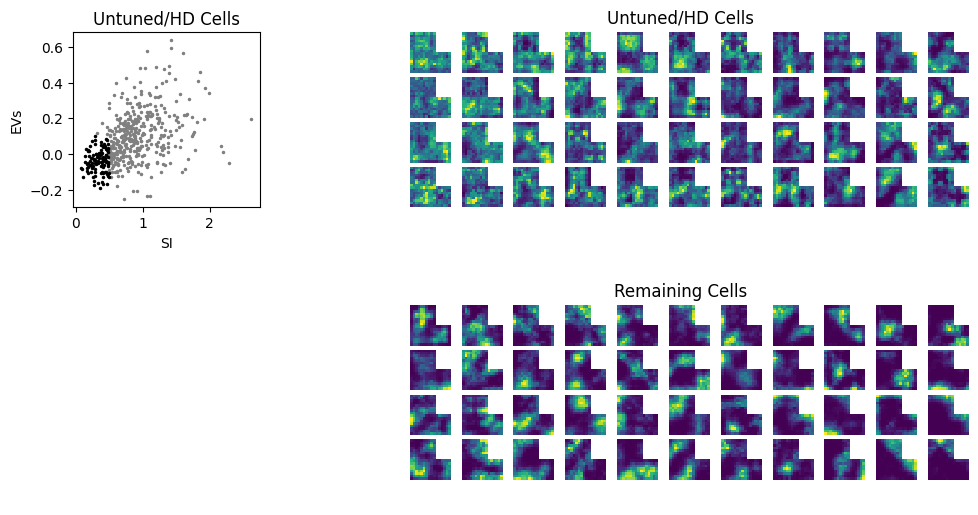

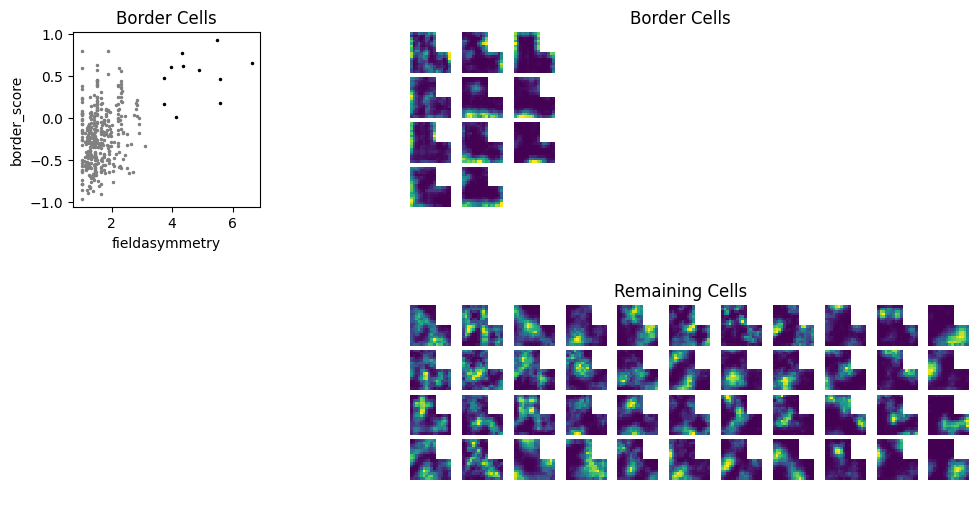

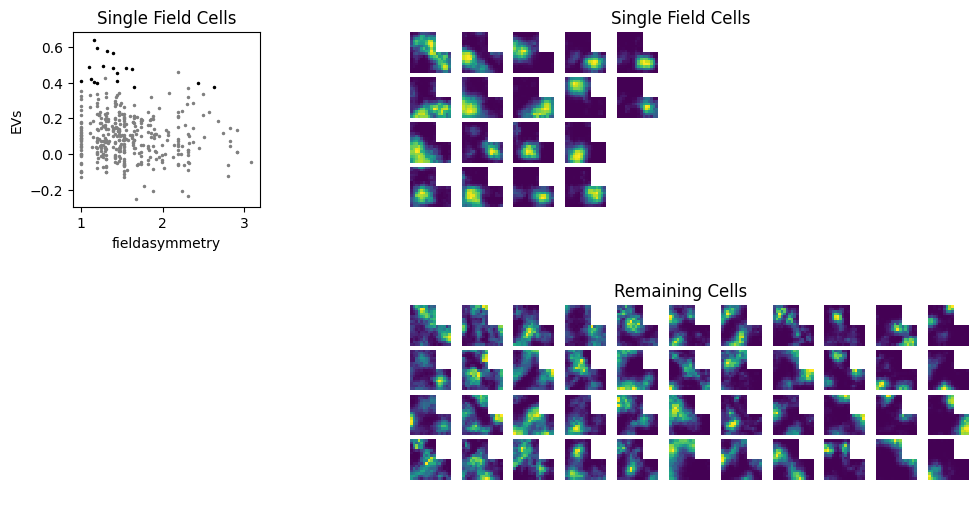

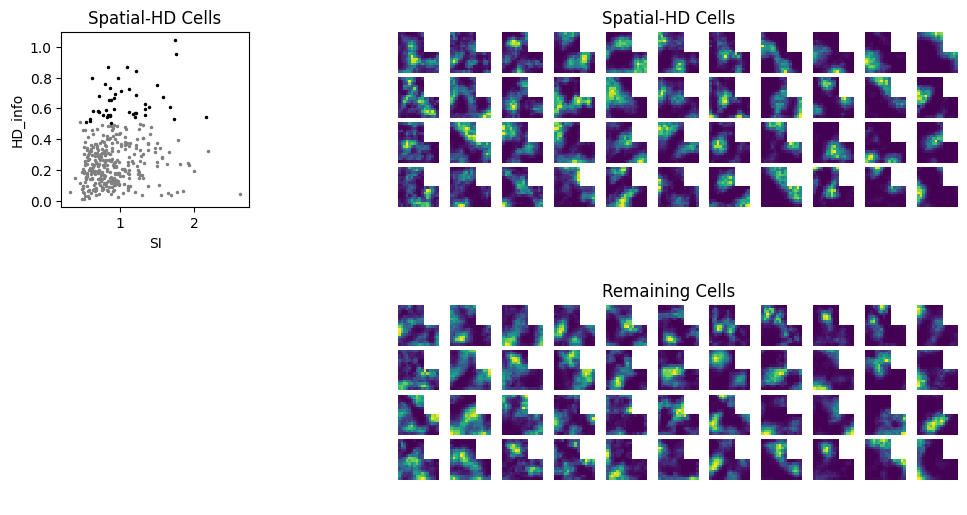

In [6]:
fig1, fig2, fig3, fig4 = TCA.cellClassificationFigures()

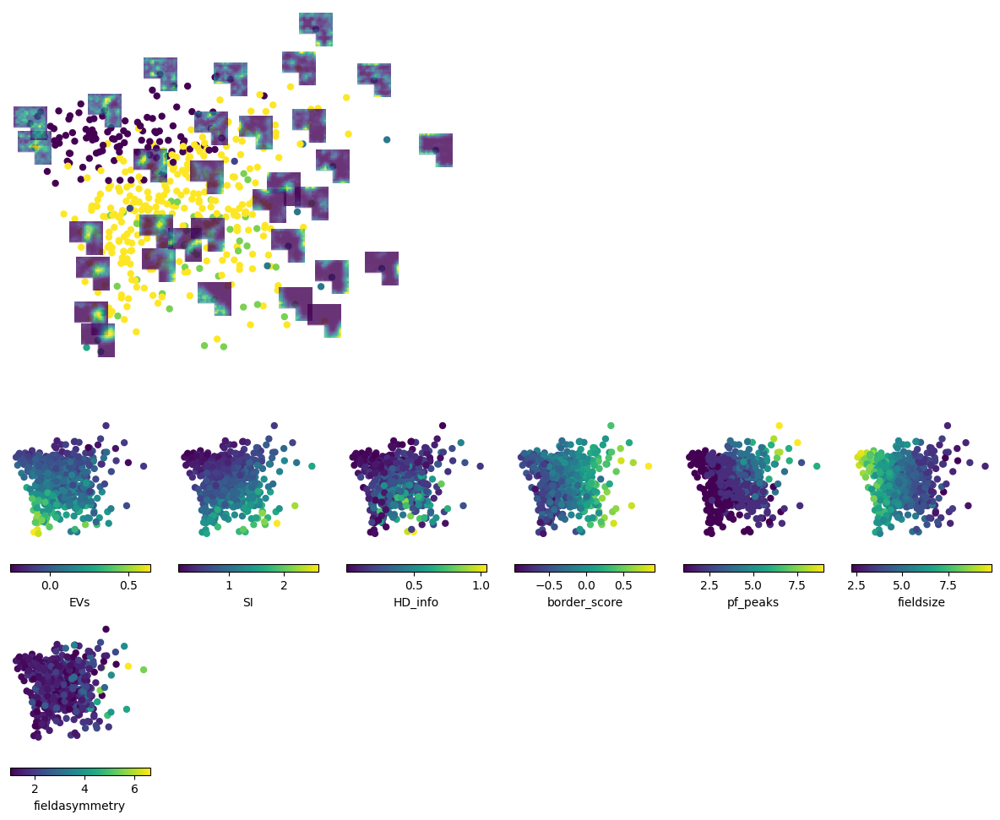

In [10]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


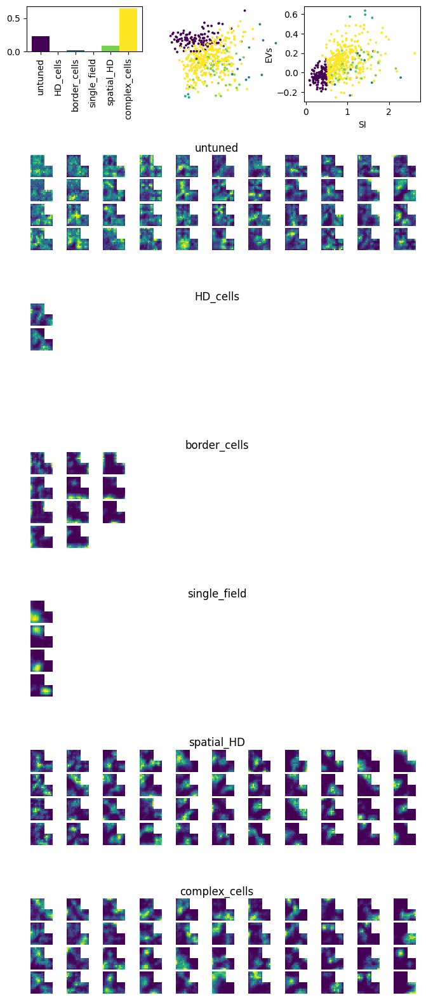

In [11]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_NS_Vis', savefolder,
                    filetype='pdf')

### k=1 Visual

In [12]:
prednet = PredictiveNet.loadNet('example_net_RiaB_batch2/thRNN_1win-ContSpeedOnehotHD-s8')

Net Loaded from pathname


In [13]:
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=1, border_symmetry_slope=4)

Calculating EV_s
Running WAKE


In [14]:
# TCA.groupCells(EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=1, border_symmetry_slope=3)
TCA.groupCells(EV_unthresh=0.1, EV_thresh=0.35)

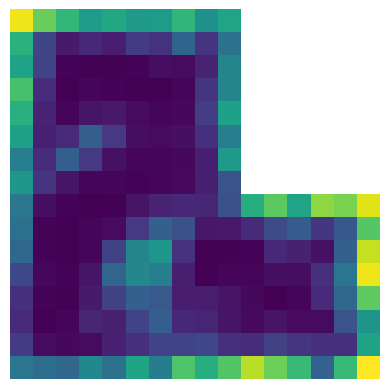

In [15]:
n = 158
TCA.tuningCurvepanel(n)

In [16]:
TCA.metrics['border_score'][158]

0.6025583217219665

In [17]:
TCA.metrics['fieldasymmetry'][158]

2.23606797749979

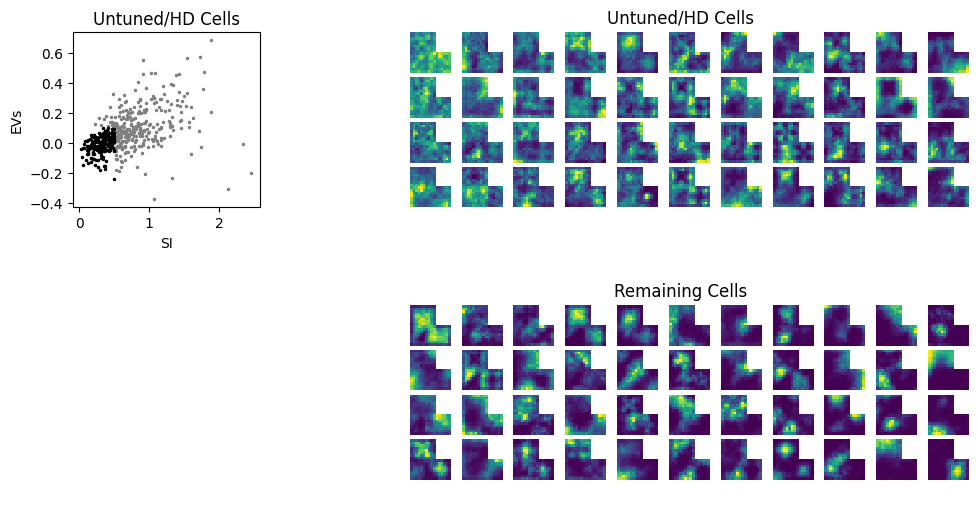

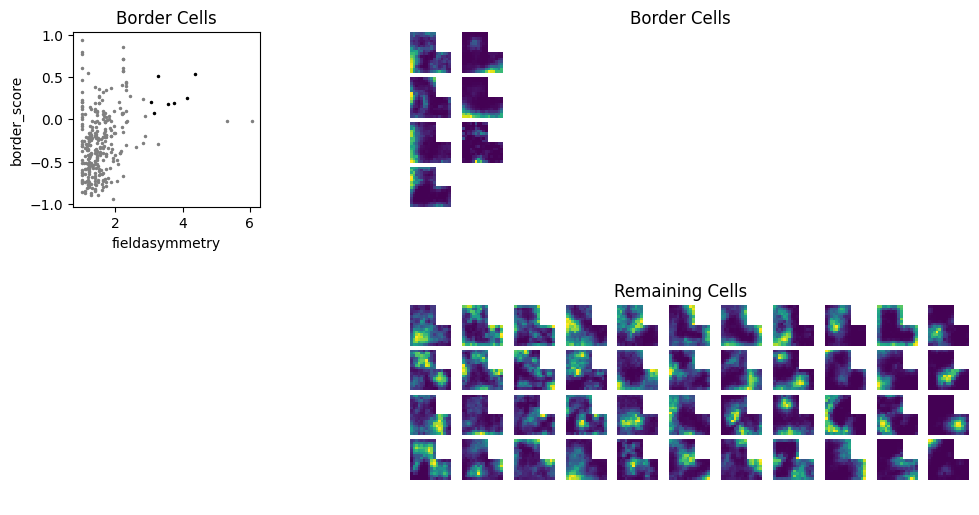

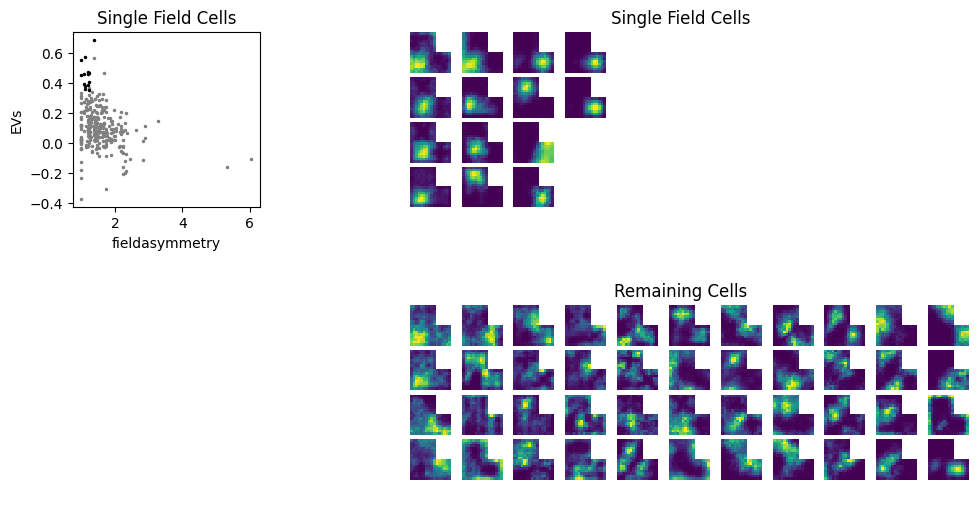

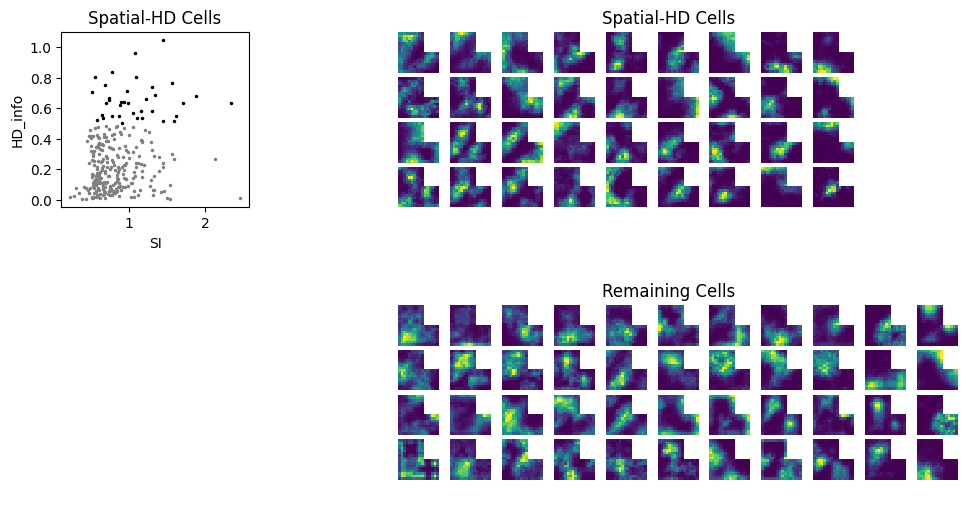

In [18]:
fig1, fig2, fig3, fig4 = TCA.cellClassificationFigures()

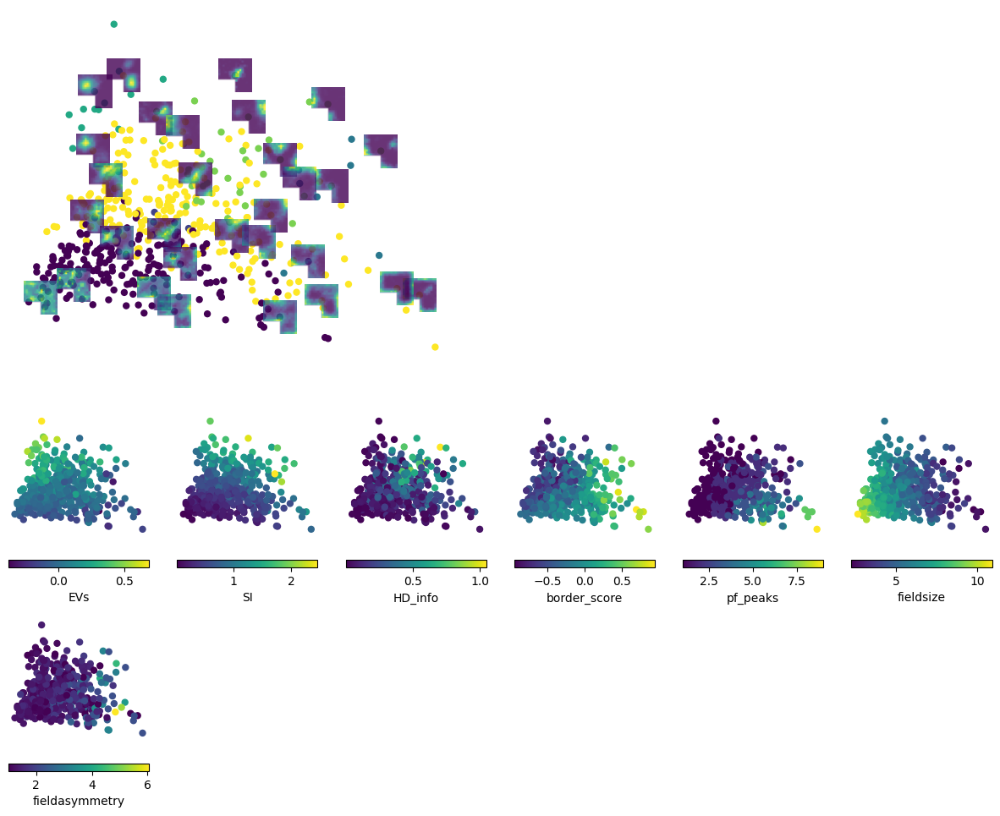

In [19]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


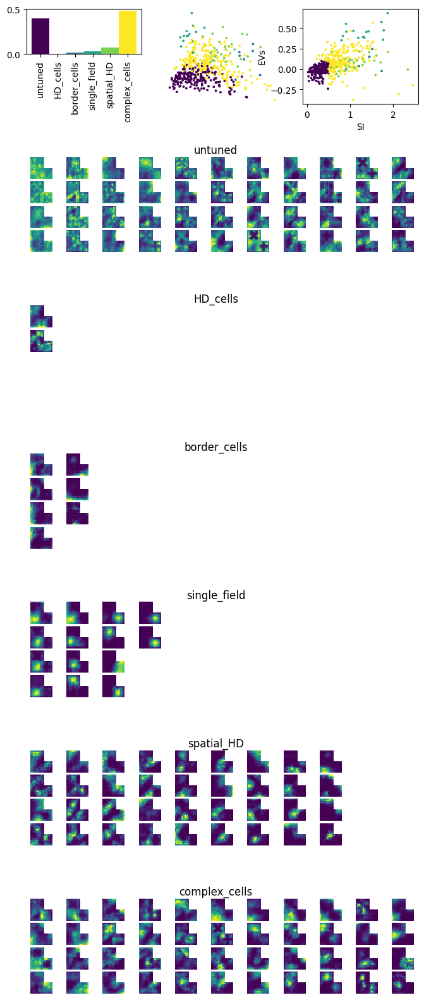

In [20]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k1_Vis', savefolder,
                    filetype='pdf')

### k=5 Visual

In [21]:
prednet = PredictiveNet.loadNet('example_net_RiaB_batch2/thRNN_5win-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [22]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:378: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:389: RuntimeWarning: invalid value encountered in true_divide
  SI = SI / fr[:, 0, 0]
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:290: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr


Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:174: RuntimeWarning: invalid value encountered in true_divide
  EVSpace = 1 - np.var(spaceRemoved,axis=0) / (np.var(WAKE_h,axis=0))
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:412: RuntimeWarning: invalid value encountered in double_scalars
  border_score = (mean_border_rate - mean_nonborder_rate) / (mean_border_rate + mean_nonborder_rate)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:439: RuntimeWarning: invalid value encountered in true_divide
  autocorr = autocorr/np.max(autocorr,axis=None)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  centerlabeled = labeled == whicharea
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  cen

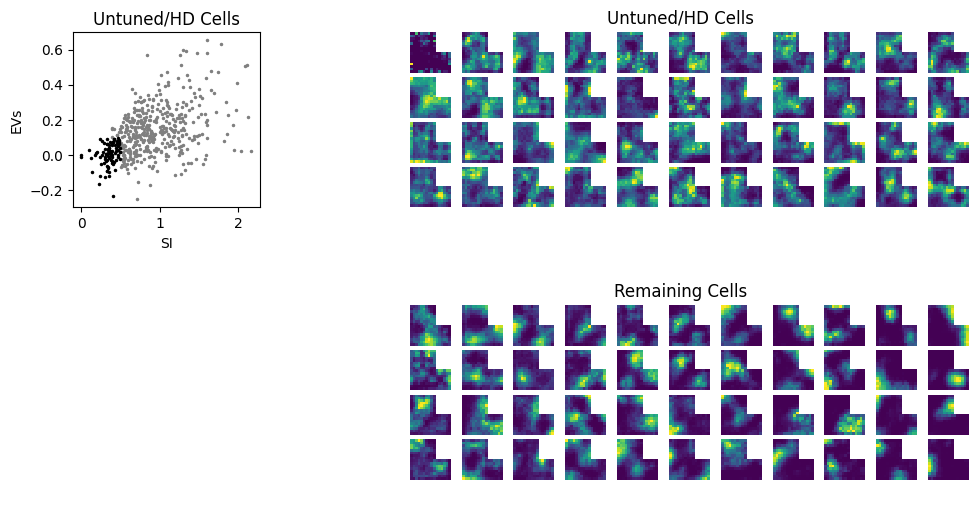

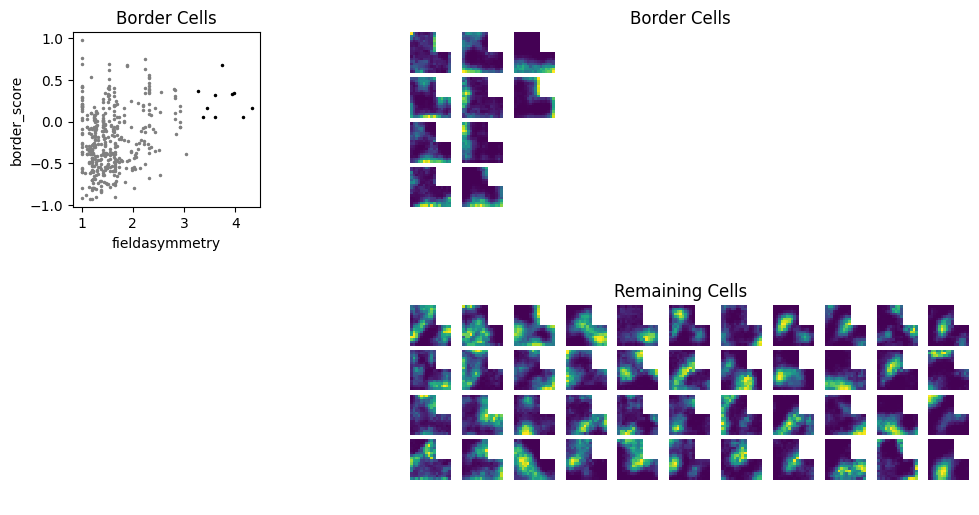

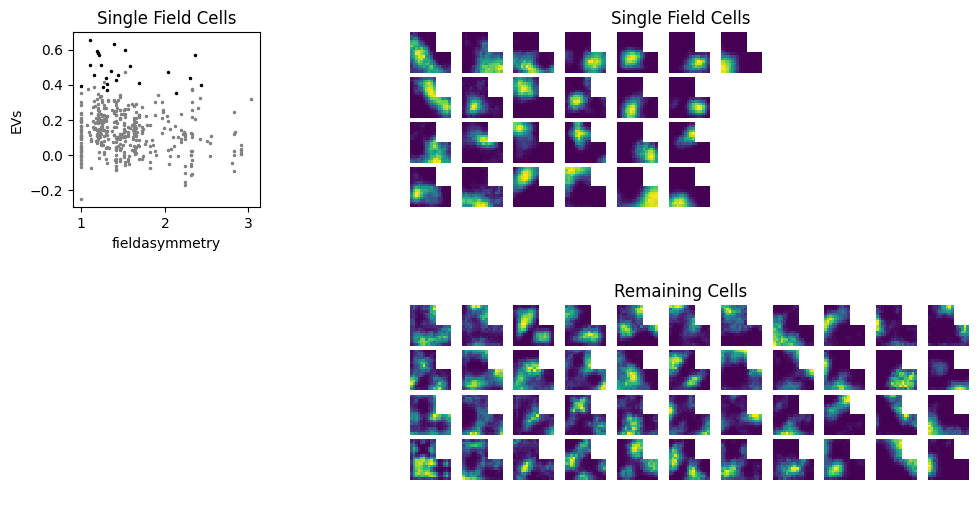

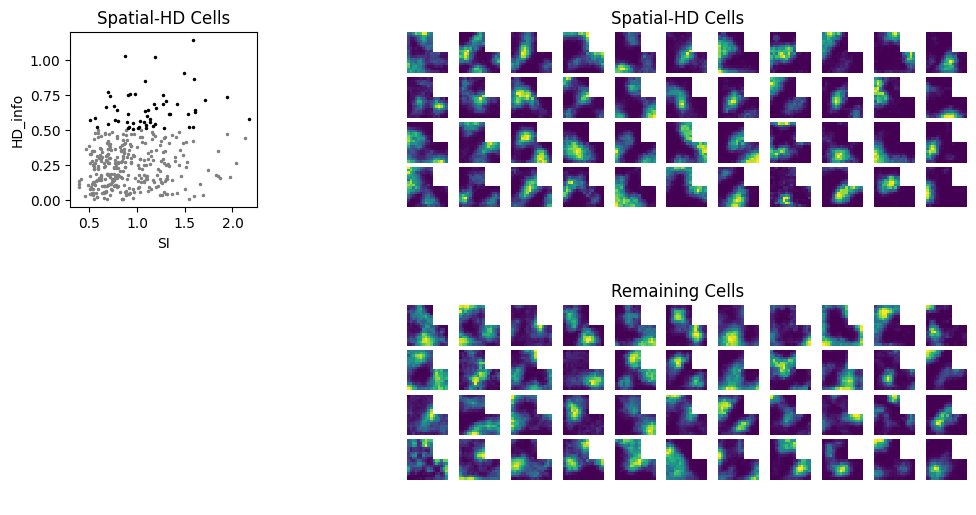

In [23]:
fig1, fig2, fig3, fig4 = TCA.cellClassificationFigures()

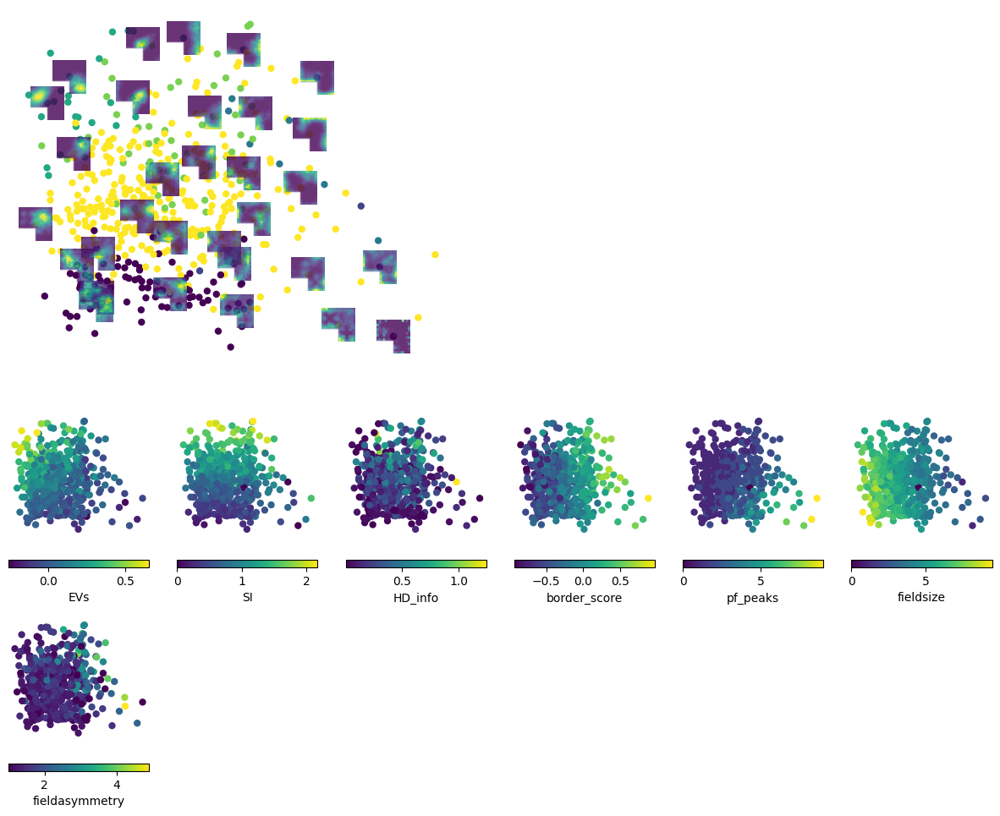

In [24]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


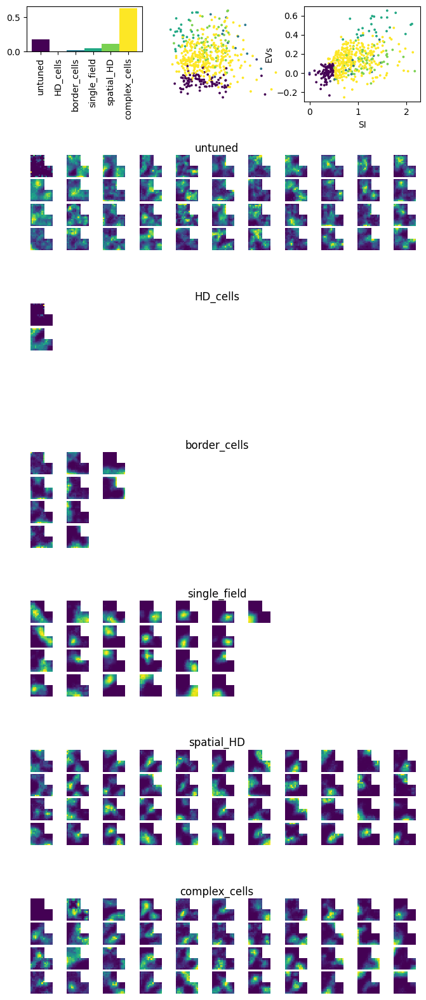

In [25]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k5_Vis', savefolder,
                    filetype='pdf')

### Sparse Visual

In [26]:
prednet = PredictiveNet.loadNet('example_net_RiaB_batch2/lognRNN_mask-ContSpeedOnehotHD-s8')

Net Loaded from pathname


In [27]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


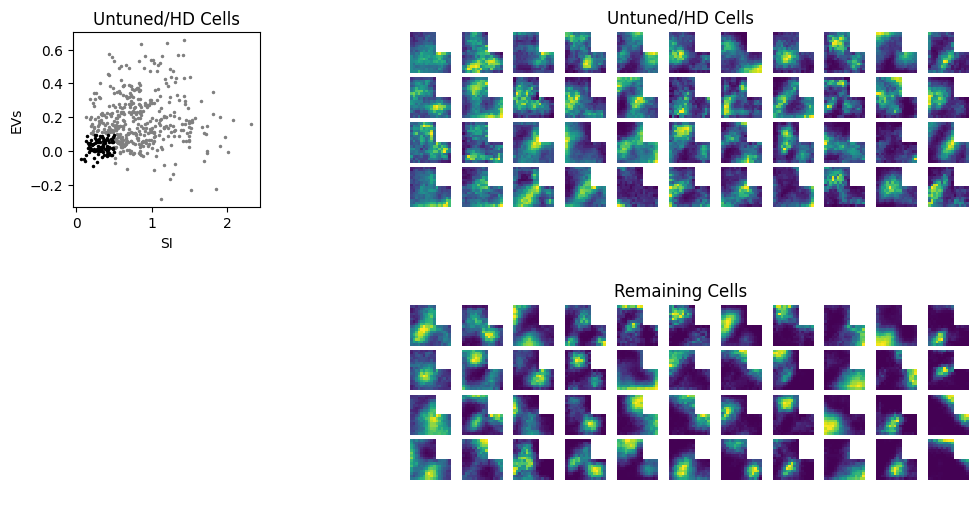

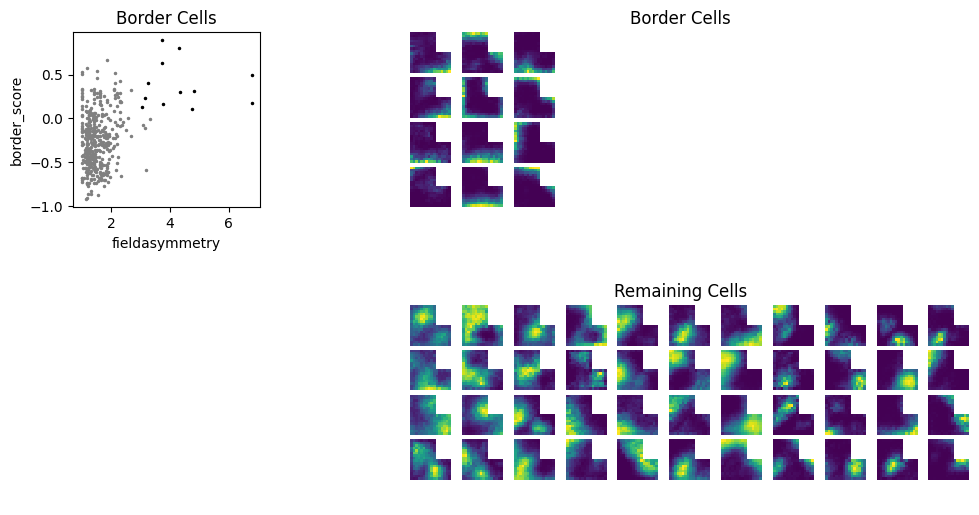

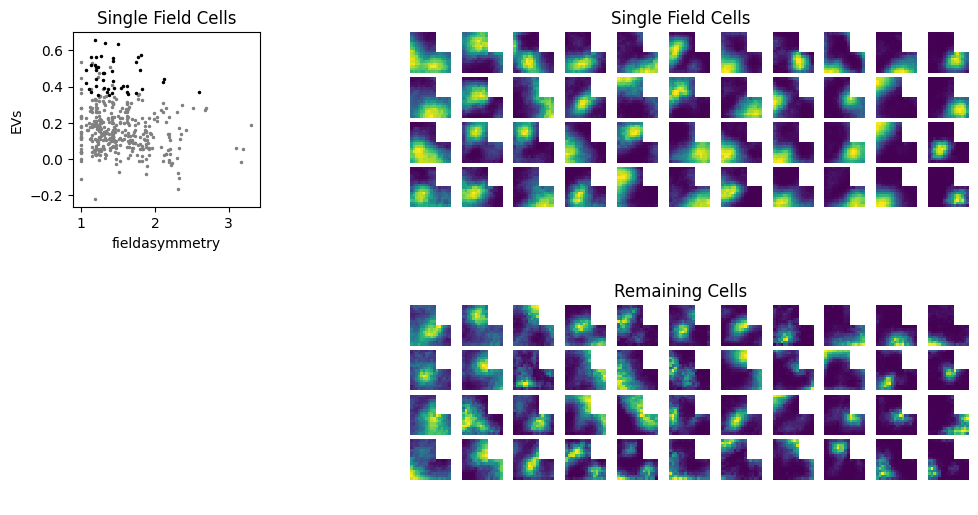

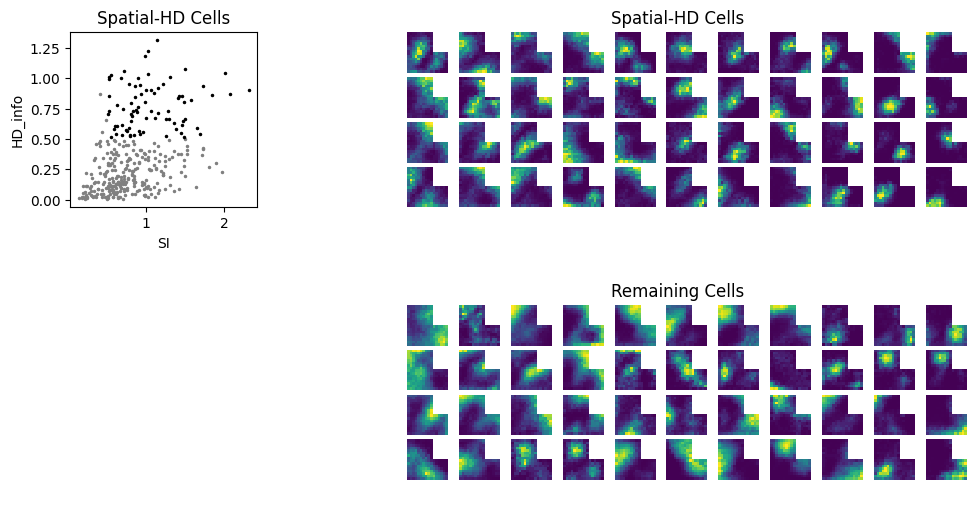

In [28]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

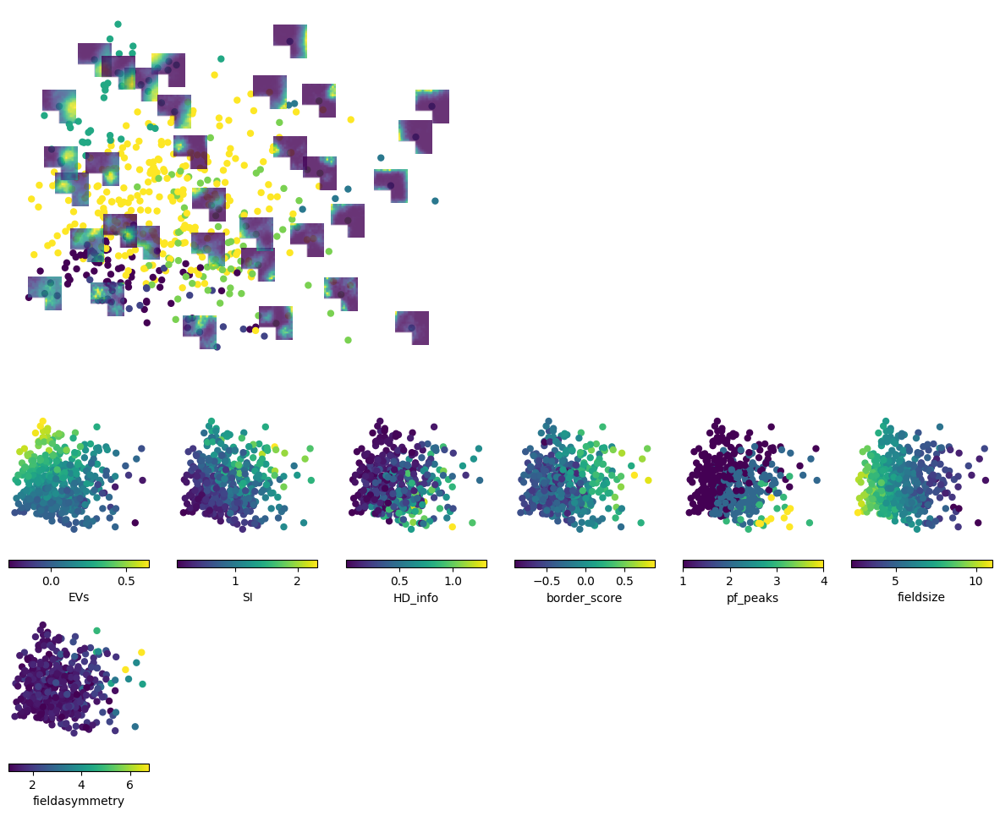

In [29]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


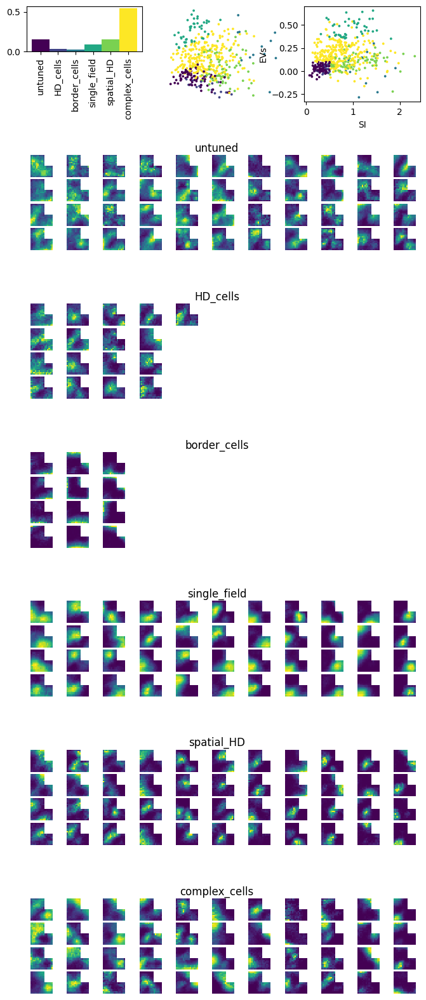

In [30]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_sparse_Vis', savefolder,
                    filetype='pdf')

### NextStep Grid

In [ ]:
prednet = PredictiveNet.loadNet('example_net_RiaB_grid_batch2/AutoencoderPred_LN-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [ ]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


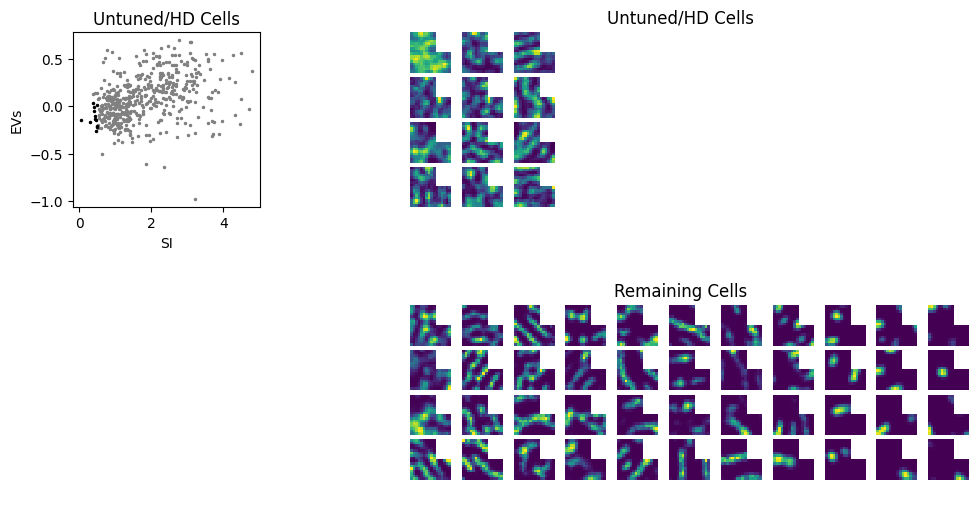

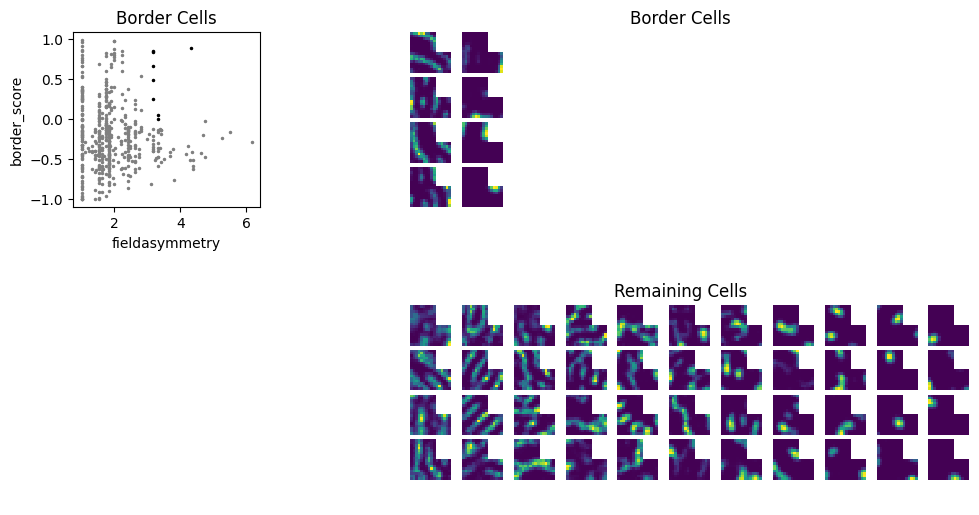

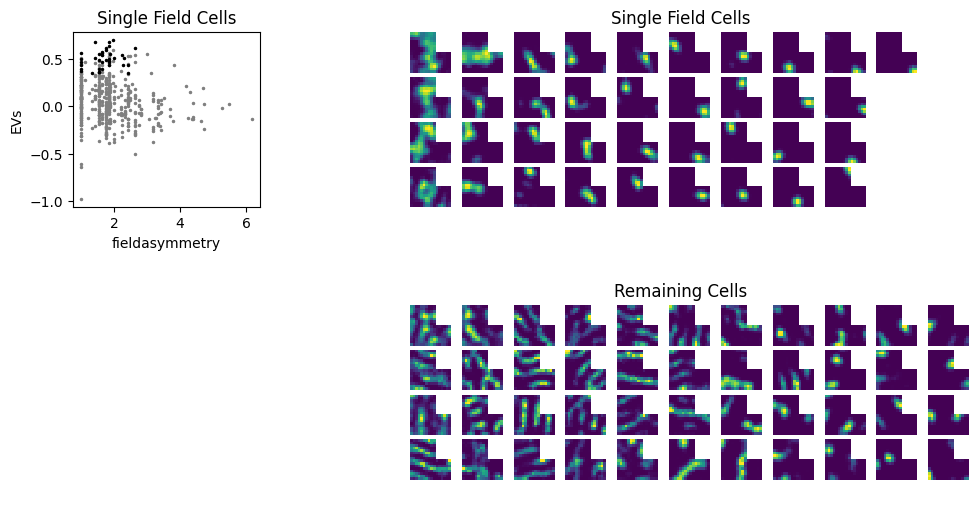

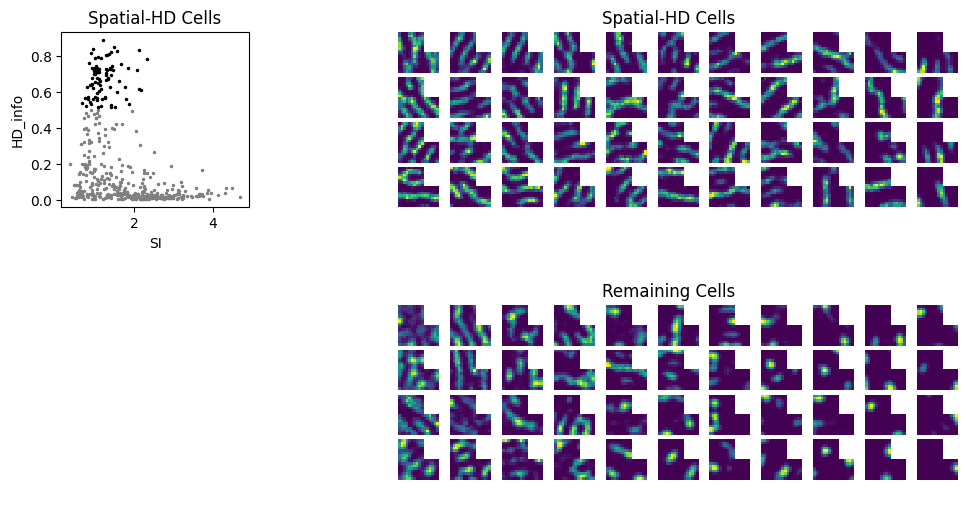

In [ ]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

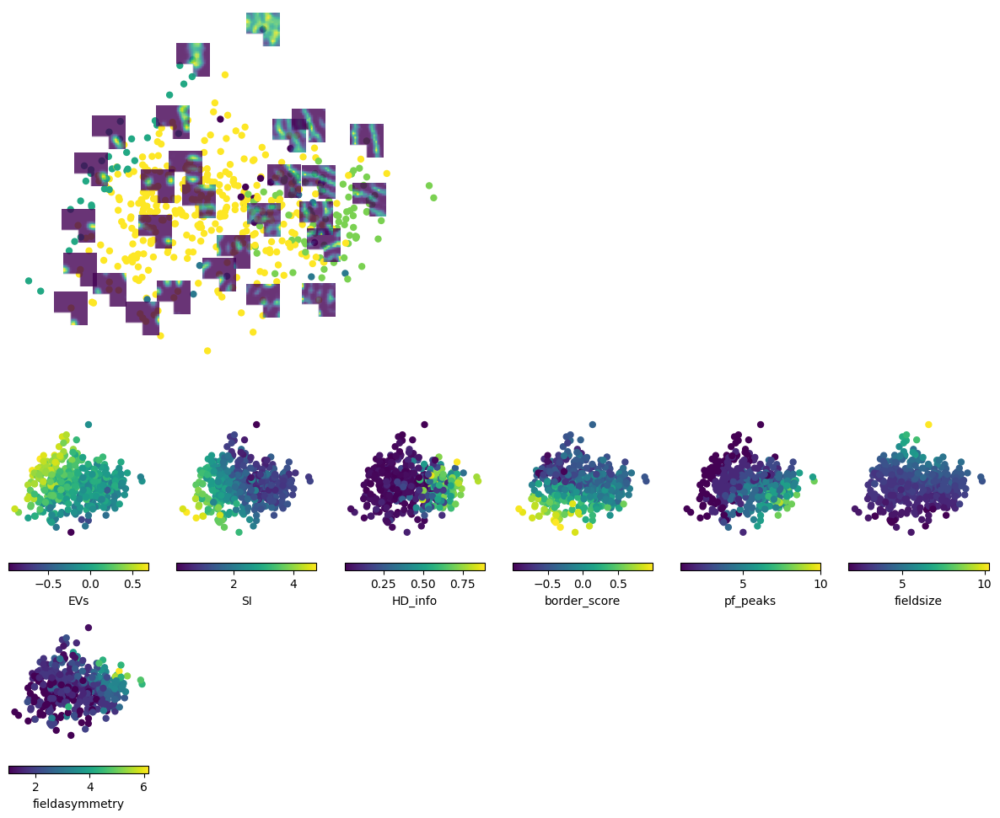

In [ ]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


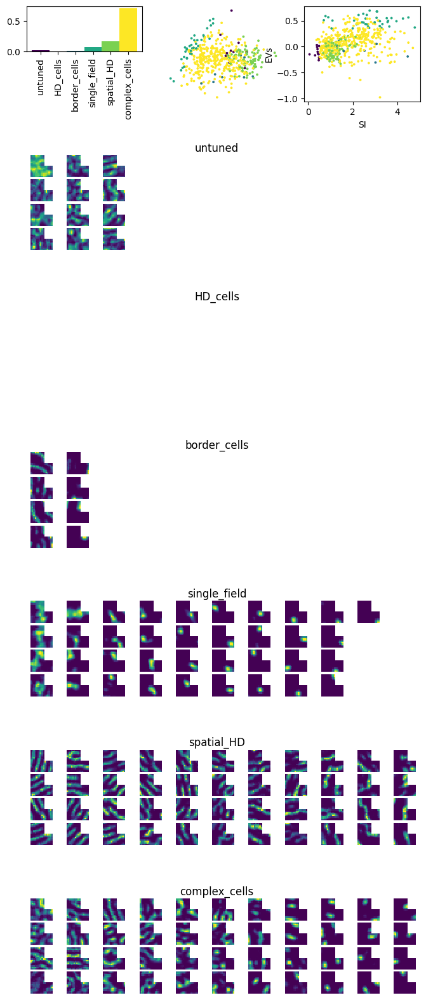

In [ ]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_NS_Grid', savefolder,
                    filetype='pdf')

### k=1 Grid

In [36]:
prednet = PredictiveNet.loadNet('example_net_RiaB_grid_batch2/thRNN_1win-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [37]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:481: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov = np.cov(coords.T)
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/numpy/lib/function_base.py:2680: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/numpy/lib/function_base.py:2680: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


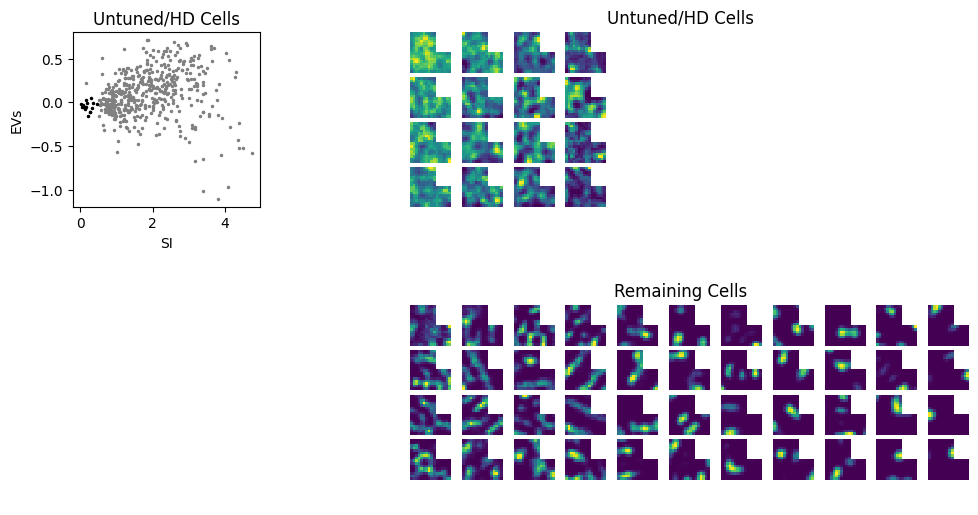

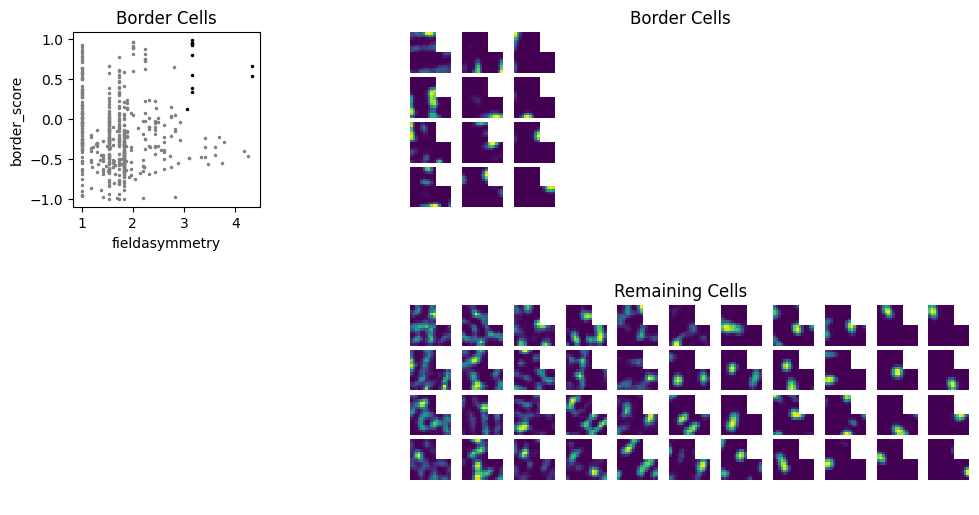

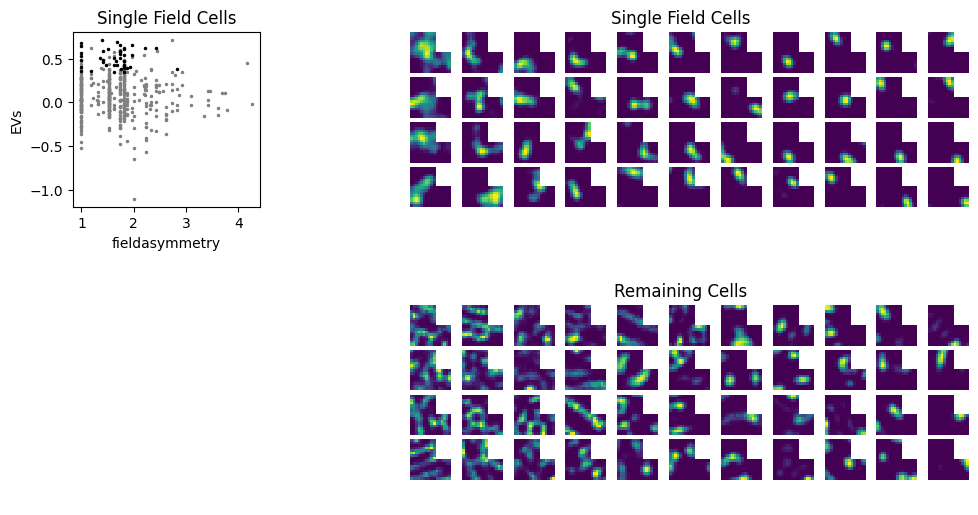

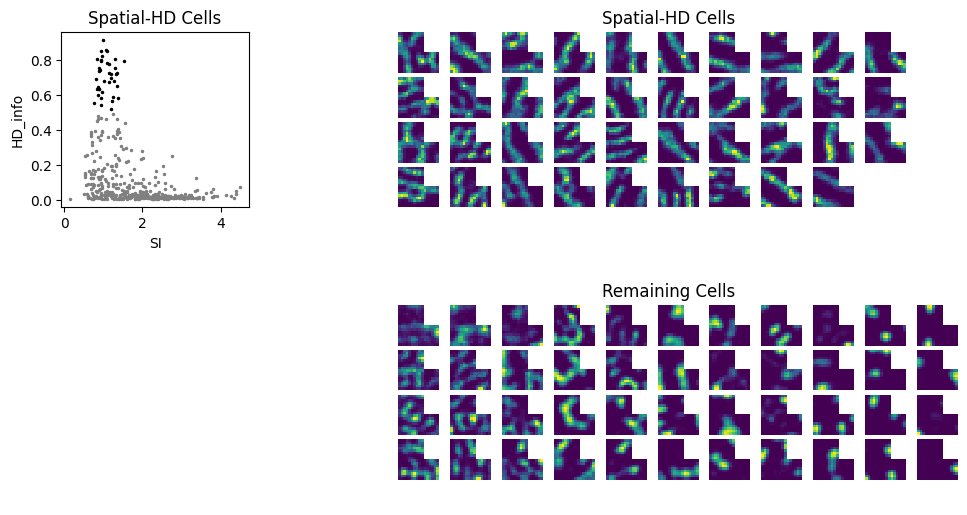

In [38]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

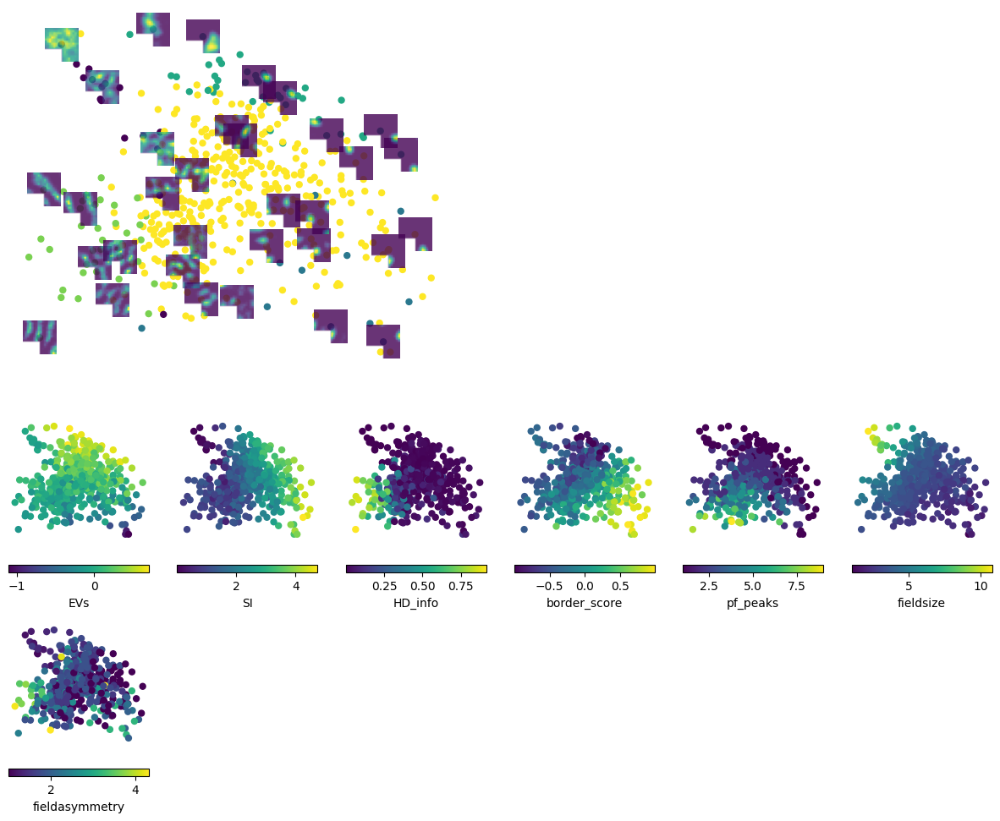

In [39]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


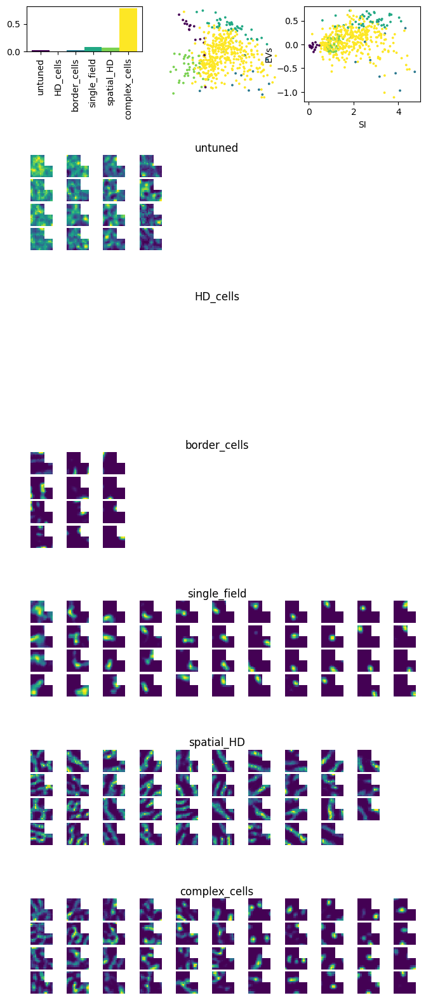

In [40]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k1_Grid', savefolder,
                    filetype='pdf')

### k=5 Grid

In [41]:
prednet = PredictiveNet.loadNet('example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [42]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:378: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:389: RuntimeWarning: invalid value encountered in true_divide
  SI = SI / fr[:, 0, 0]
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:290: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr


Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:174: RuntimeWarning: invalid value encountered in true_divide
  EVSpace = 1 - np.var(spaceRemoved,axis=0) / (np.var(WAKE_h,axis=0))
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:412: RuntimeWarning: invalid value encountered in double_scalars
  border_score = (mean_border_rate - mean_nonborder_rate) / (mean_border_rate + mean_nonborder_rate)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:439: RuntimeWarning: invalid value encountered in true_divide
  autocorr = autocorr/np.max(autocorr,axis=None)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  centerlabeled = labeled == whicharea
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  cen

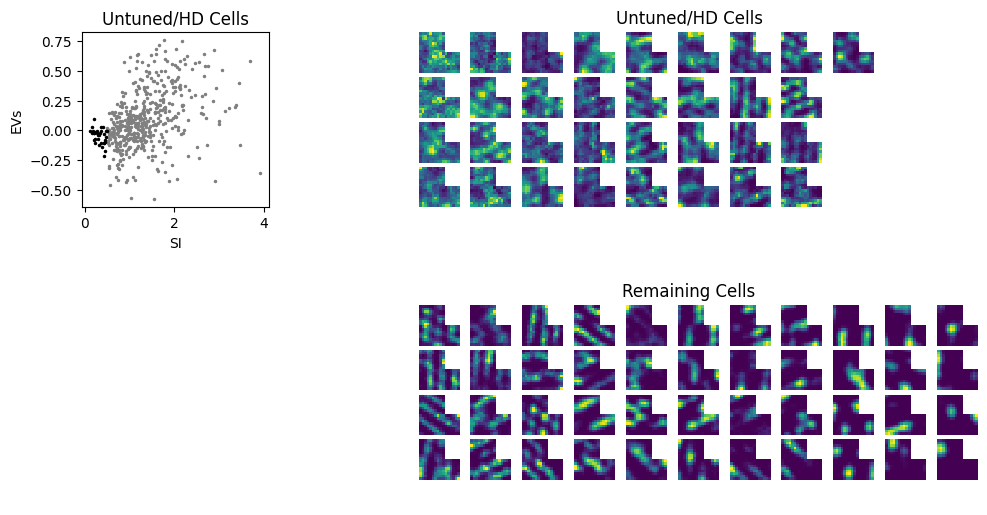

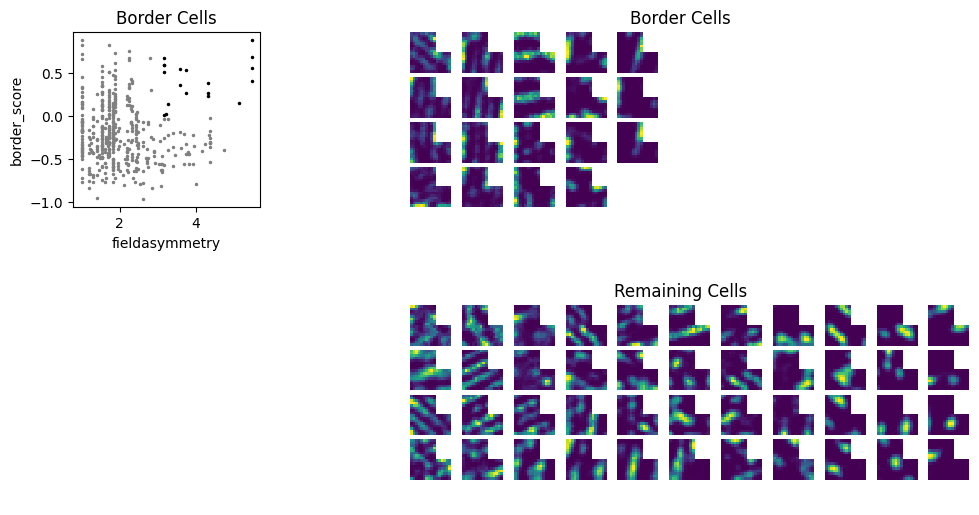

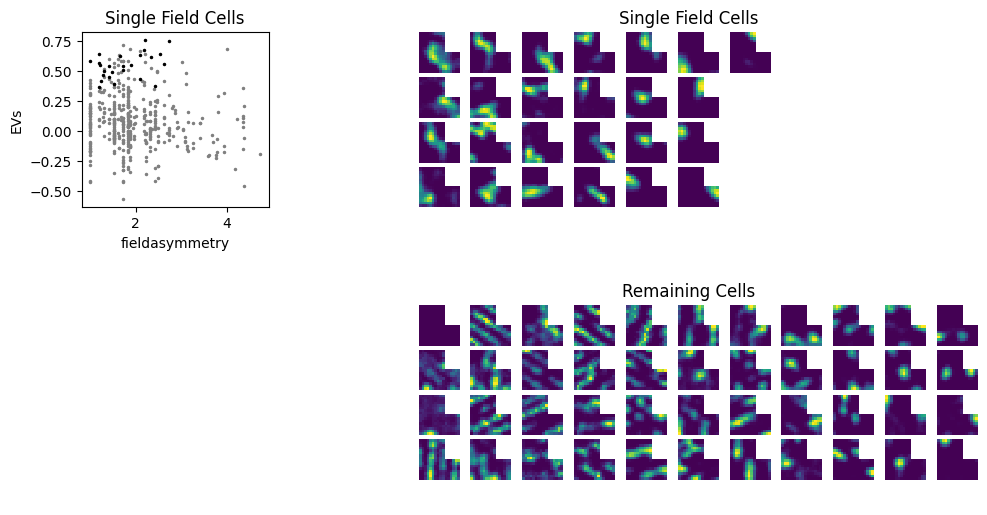

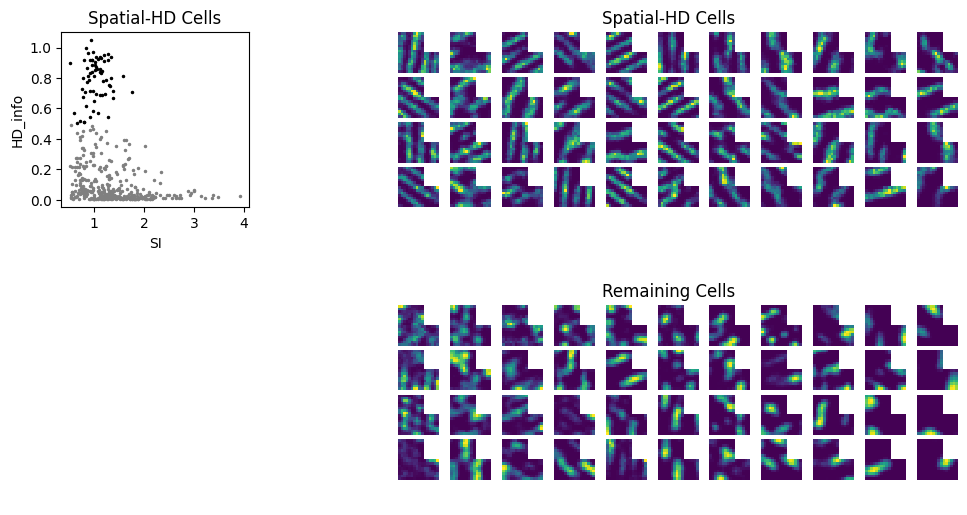

In [43]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

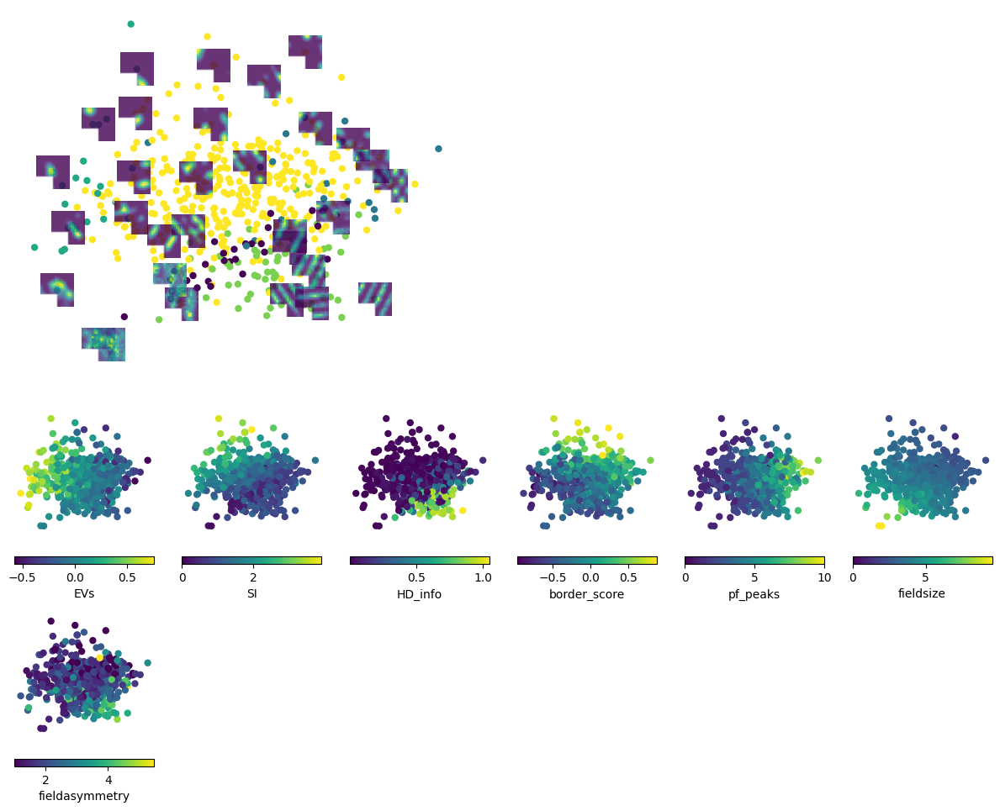

In [44]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


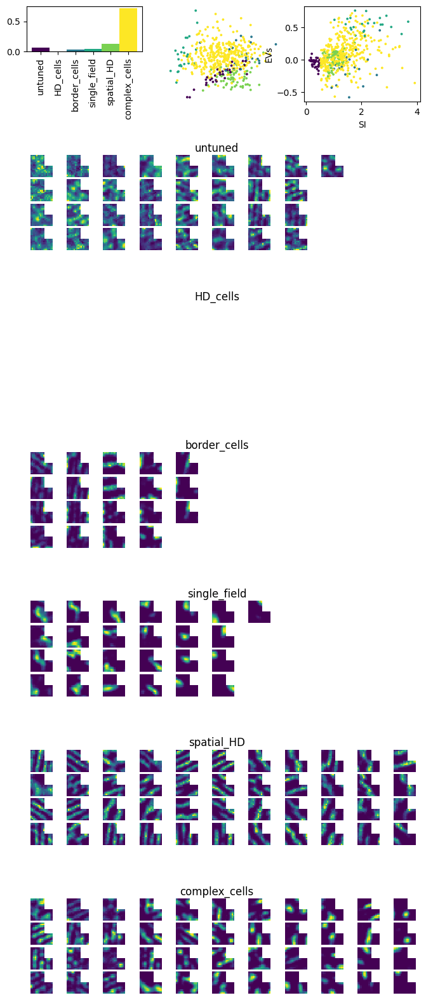

In [45]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k5_Grid', savefolder,
                    filetype='pdf')

### k=5 Grid->Visual

In [2]:
prednet = PredictiveNet.loadNet('example_net_RiaB_vision_grid_batch2/multRNN_5win_i1_o0-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [3]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:481: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov = np.cov(coords.T)
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/numpy/lib/function_base.py:2680: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/numpy/lib/function_base.py:2680: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


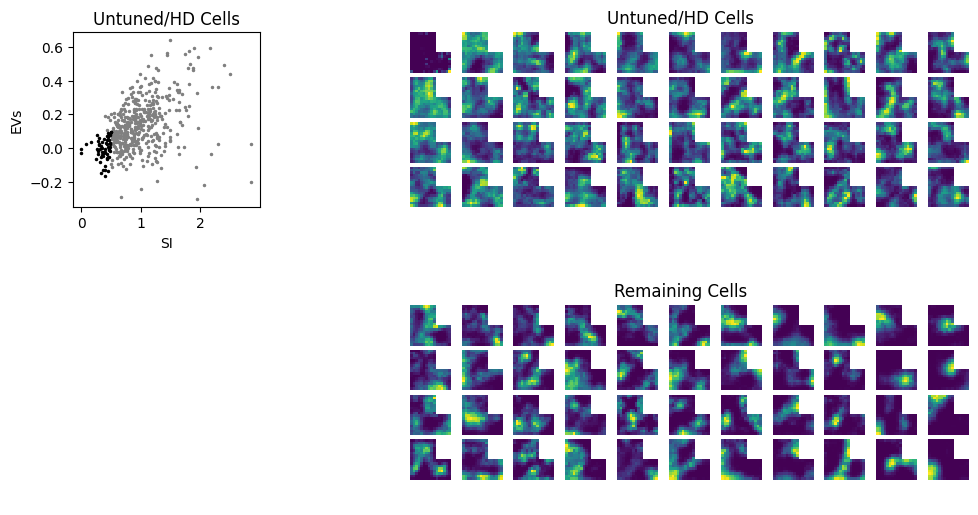

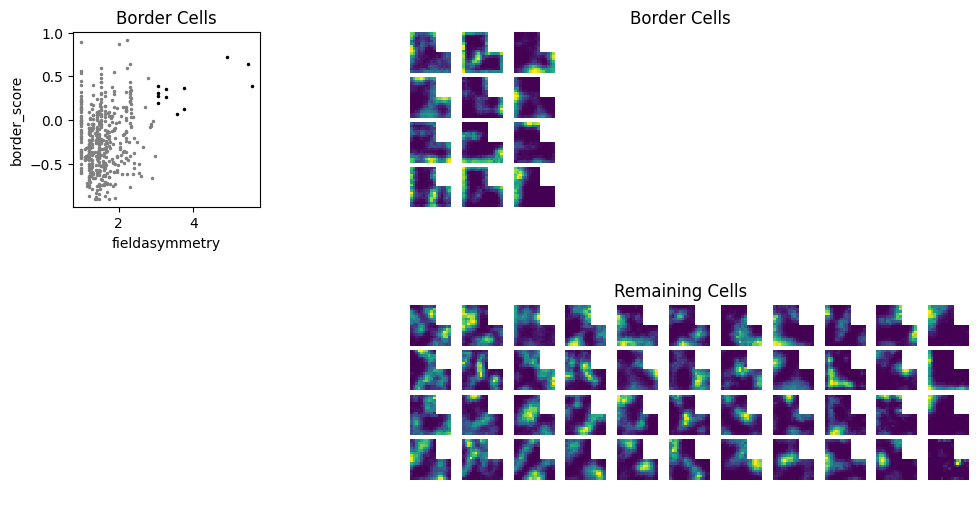

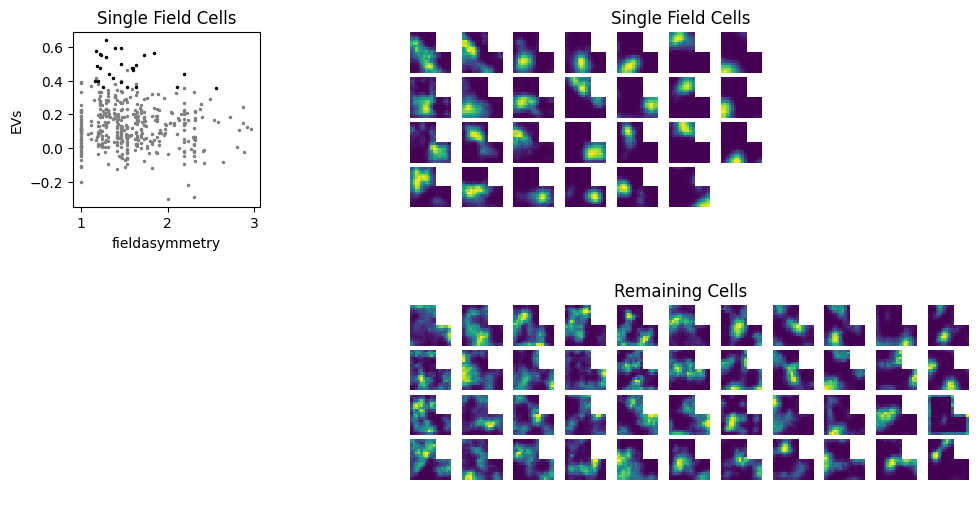

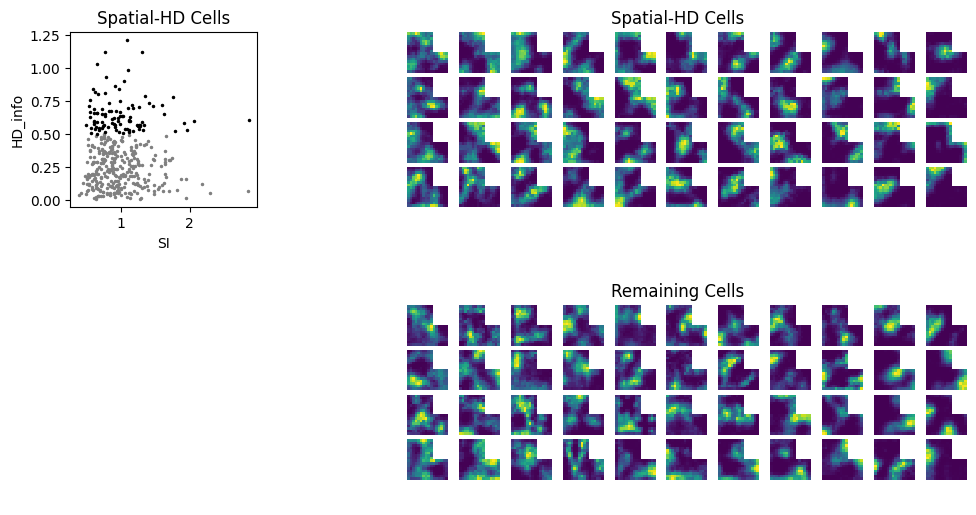

In [4]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

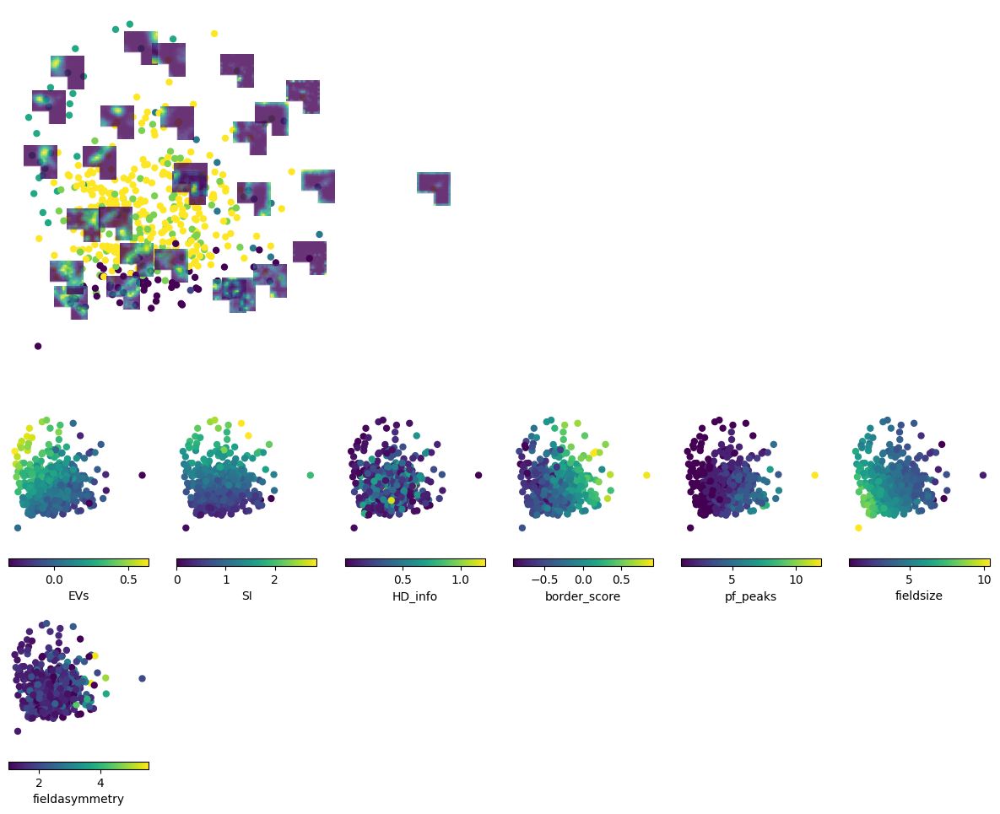

In [5]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


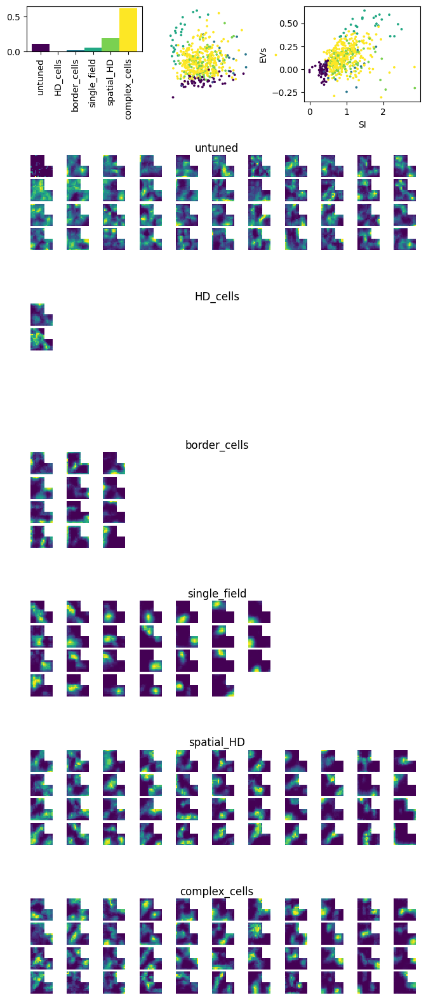

In [8]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k5_Grid->Visual', savefolder,
                    filetype='pdf')

### k=5 Grid,Visual->Grid,Visual

In [10]:
prednet = PredictiveNet.loadNet('example_net_RiaB_vision_grid_batch2/multRNN_5win_i01_o01-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [11]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


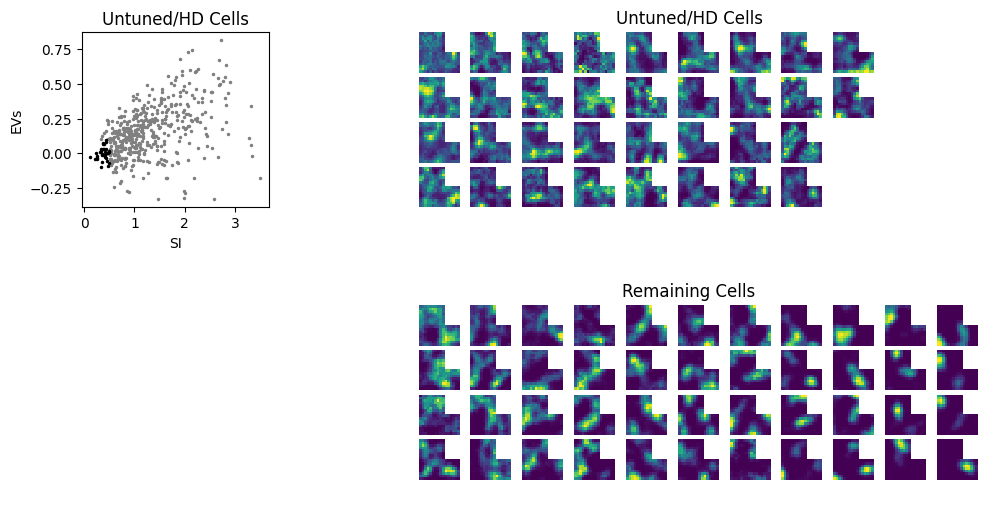

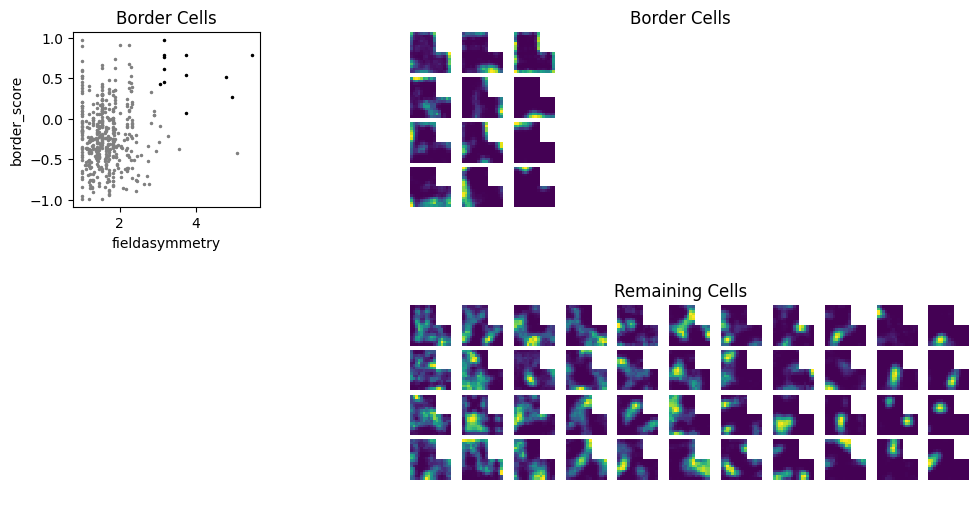

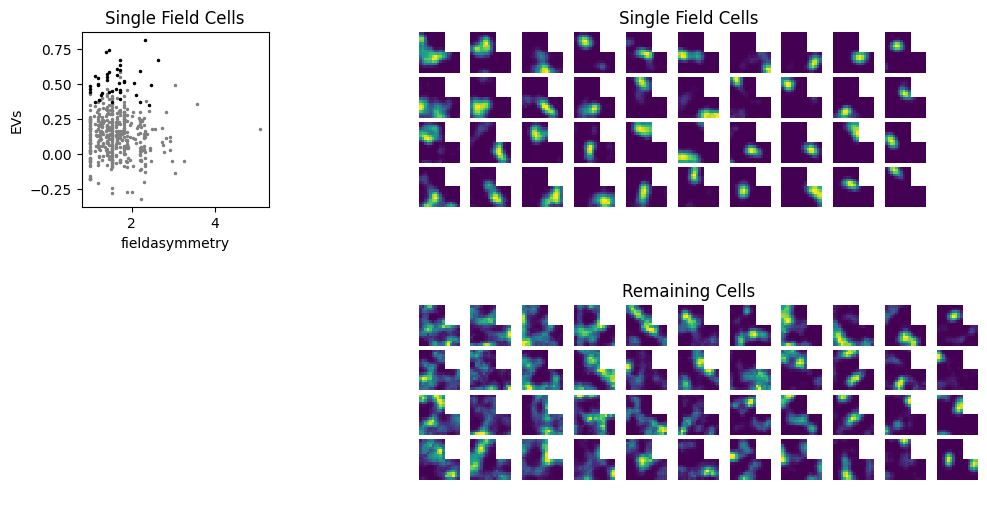

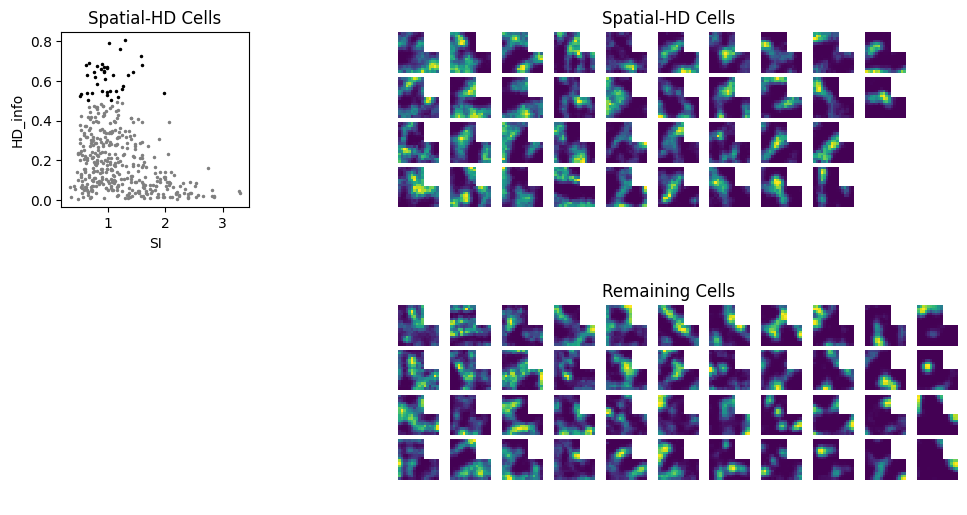

In [12]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

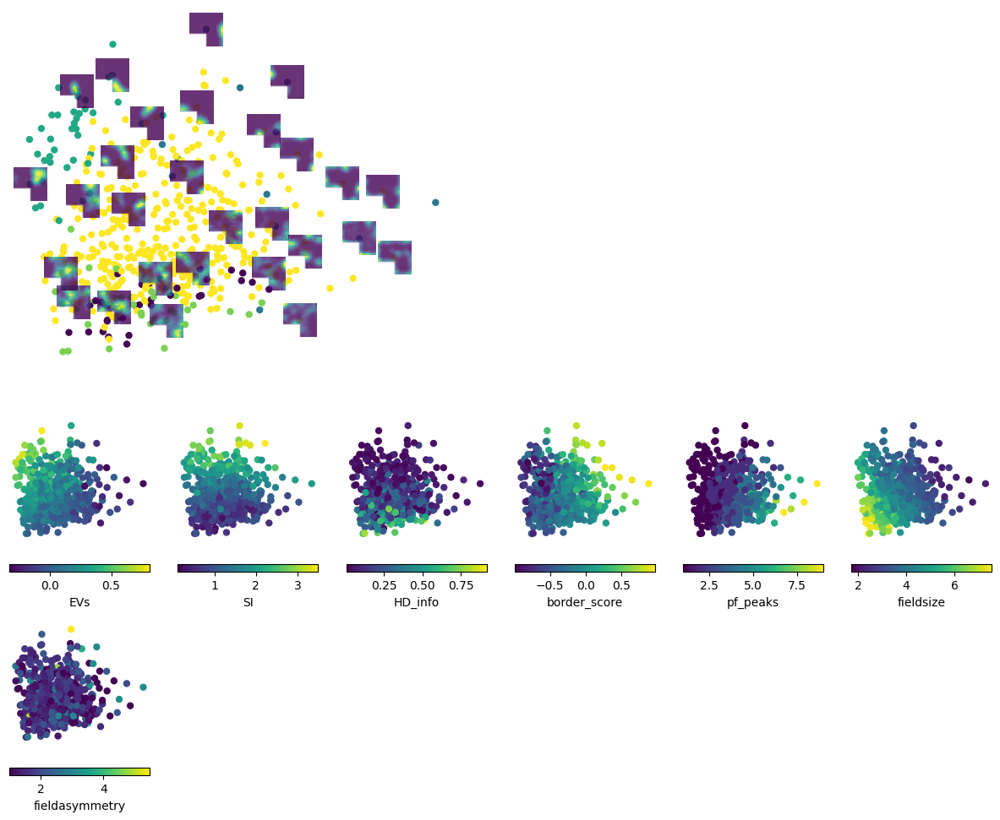

In [13]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


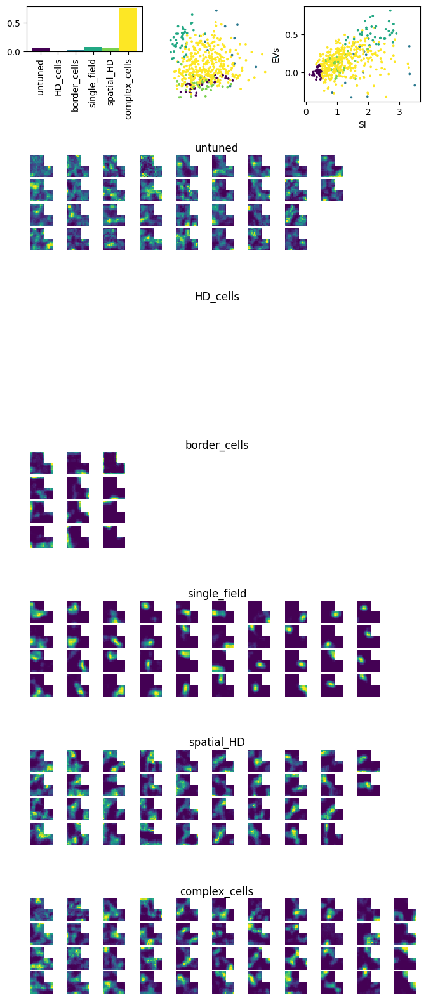

In [14]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k5_Grid+Visual->Grid+Visual', savefolder,
                    filetype='pdf')

### k=5 Visual->Grid

In [3]:
prednet = PredictiveNet.loadNet('example_net_RiaB_vision_grid_batch2/multRNN_5win_i0_o1-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [4]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:378: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:389: RuntimeWarning: invalid value encountered in true_divide
  SI = SI / fr[:, 0, 0]
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:290: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr


Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:412: RuntimeWarning: invalid value encountered in double_scalars
  border_score = (mean_border_rate - mean_nonborder_rate) / (mean_border_rate + mean_nonborder_rate)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:439: RuntimeWarning: invalid value encountered in true_divide
  autocorr = autocorr/np.max(autocorr,axis=None)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  centerlabeled = labeled == whicharea
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  centerlabeled = labeled == whicharea
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:474: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  

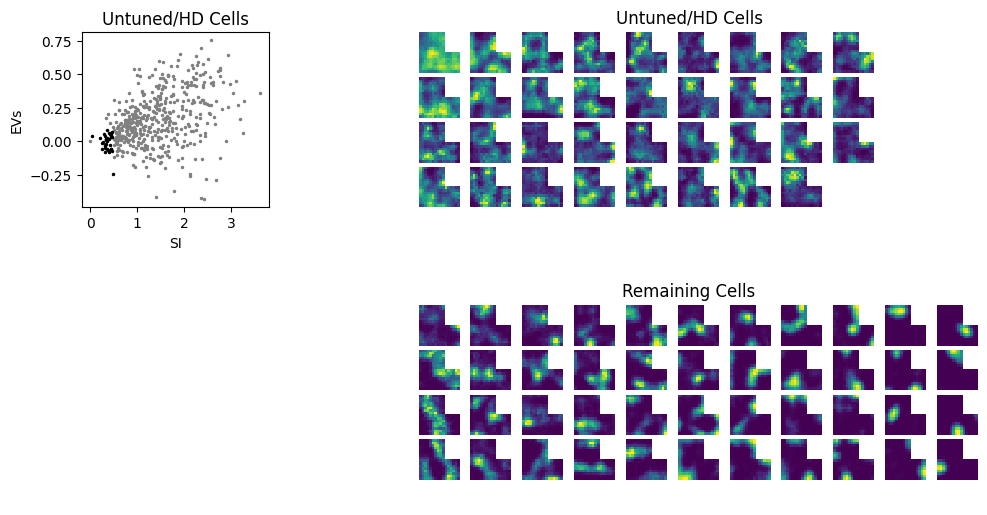

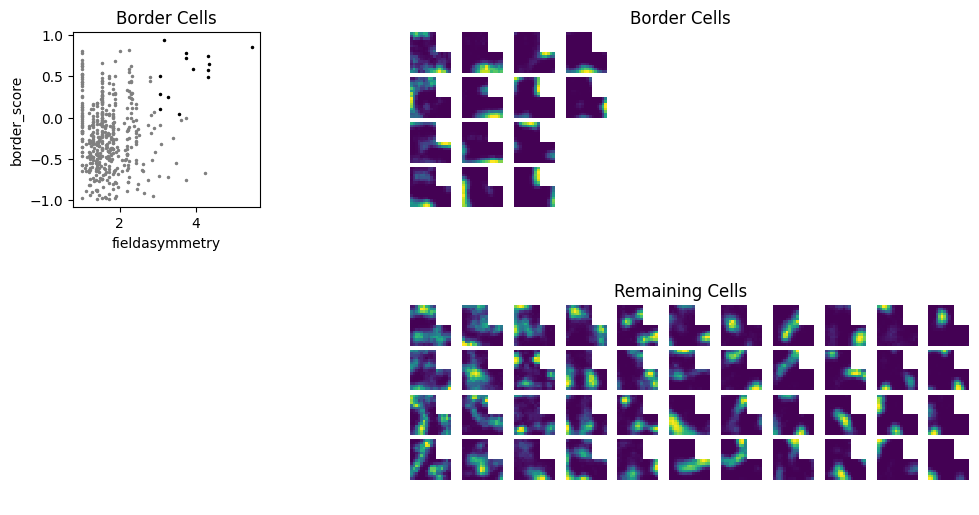

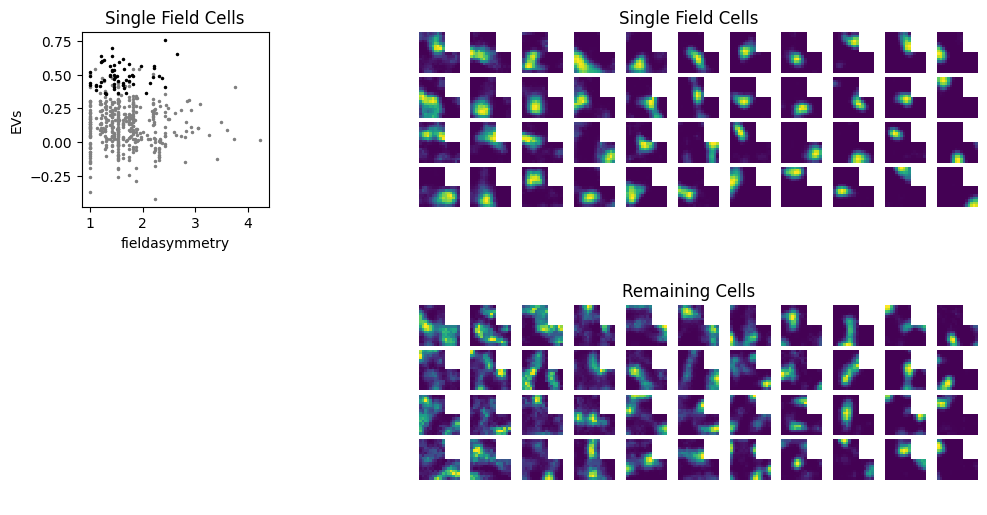

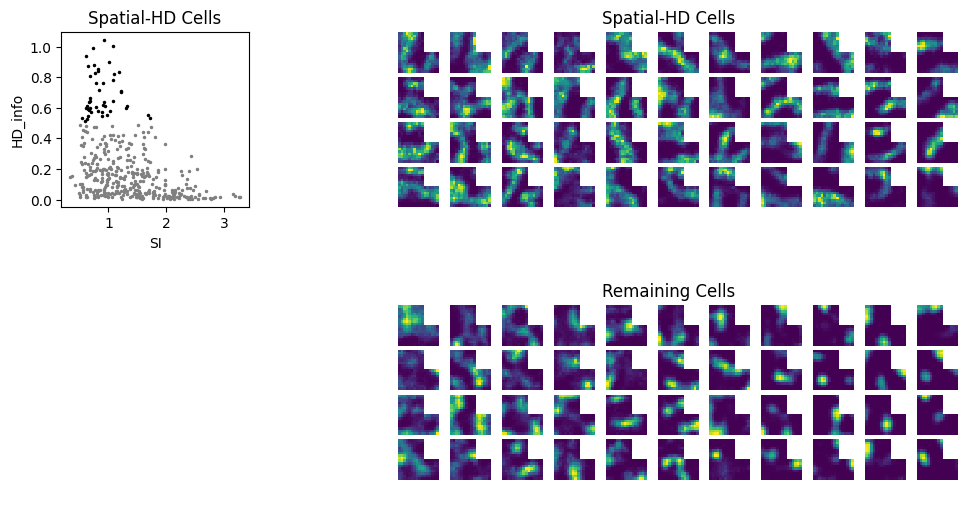

In [6]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

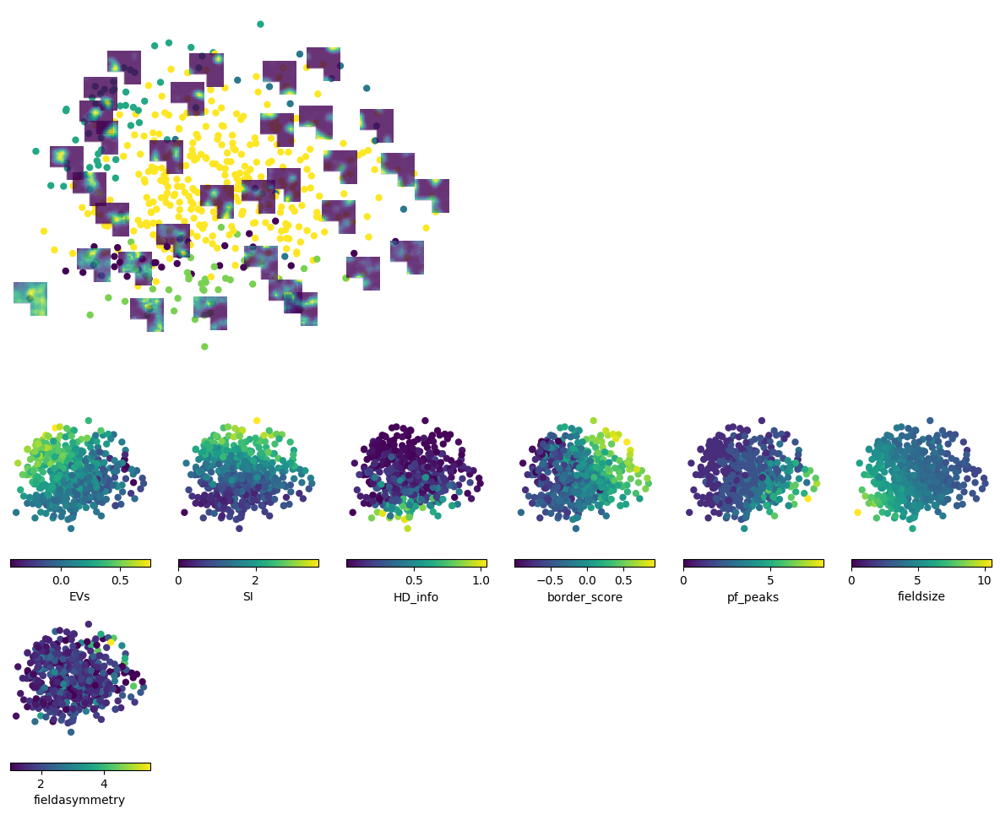

In [7]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


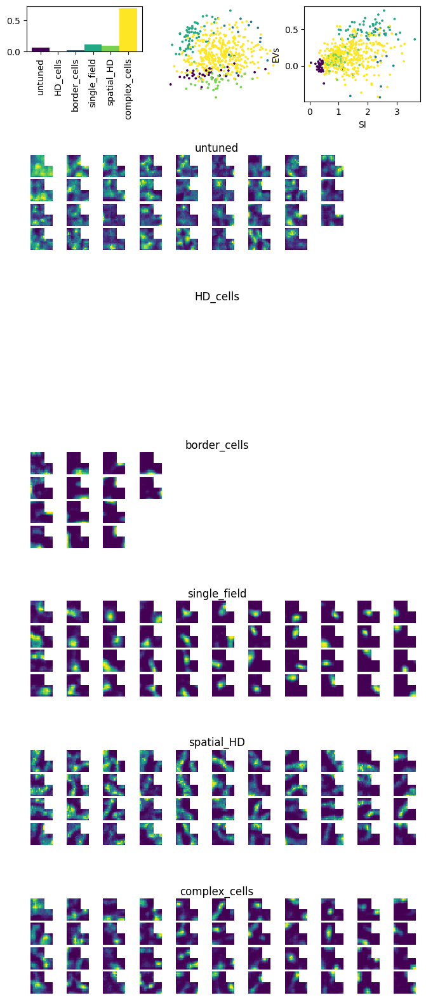

In [9]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_k5_Visual->Grid', savefolder,
                    filetype='pdf')

### Sparse Grid

In [46]:
prednet = PredictiveNet.loadNet('example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s8')
# prednet = PredictiveNet.loadNet('example_net_batch2/thRNN_5win-SpeedHD-s8')

Net Loaded from pathname


In [47]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

Calculating EV_s
Running WAKE


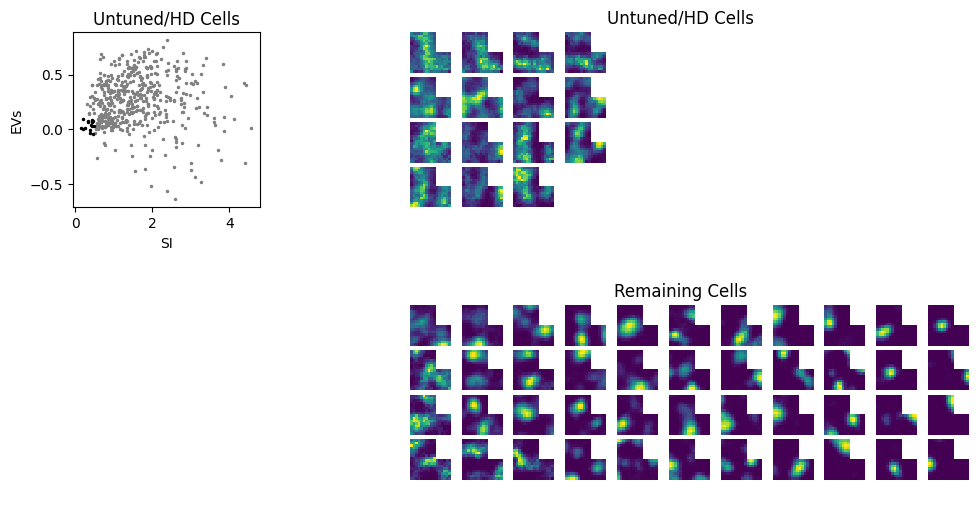

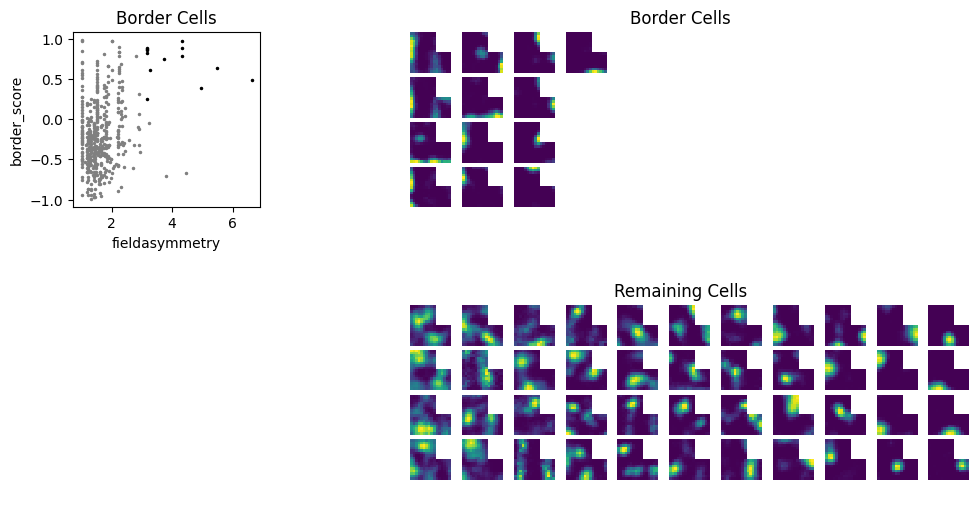

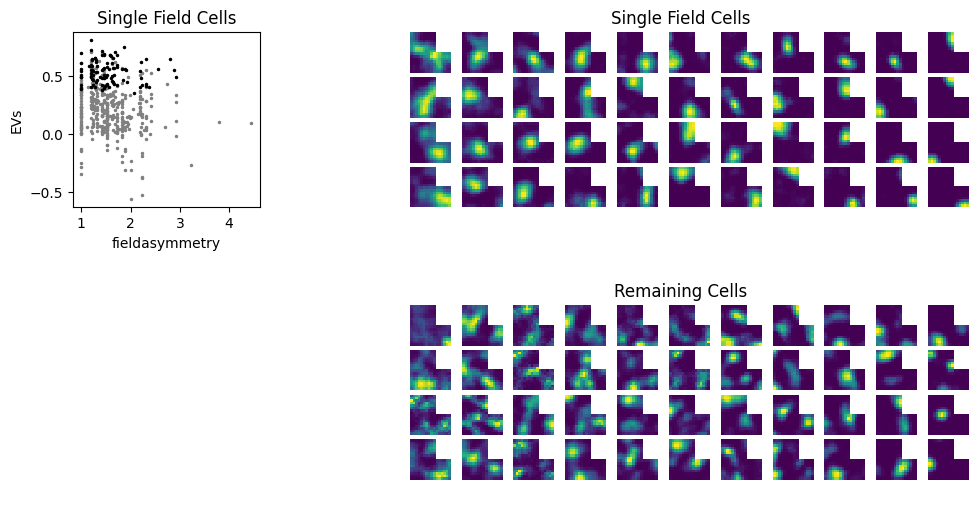

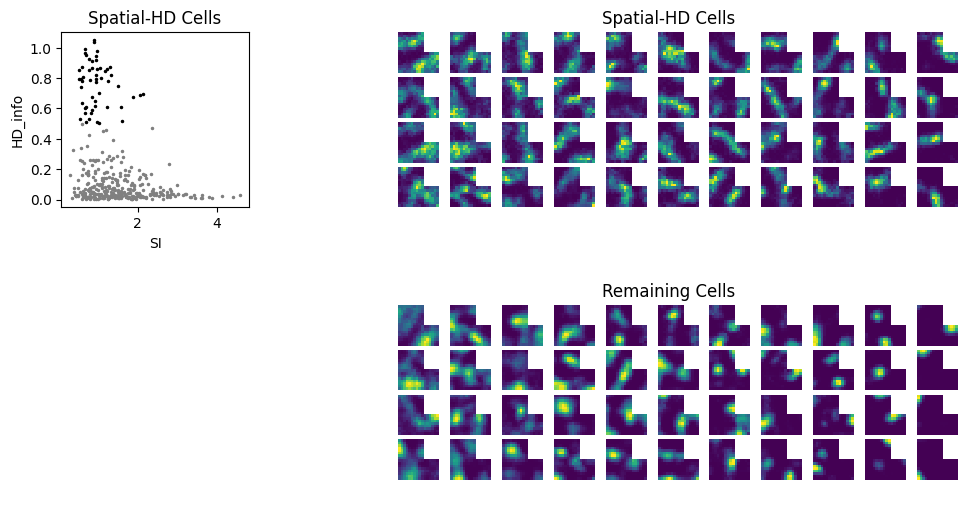

In [48]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

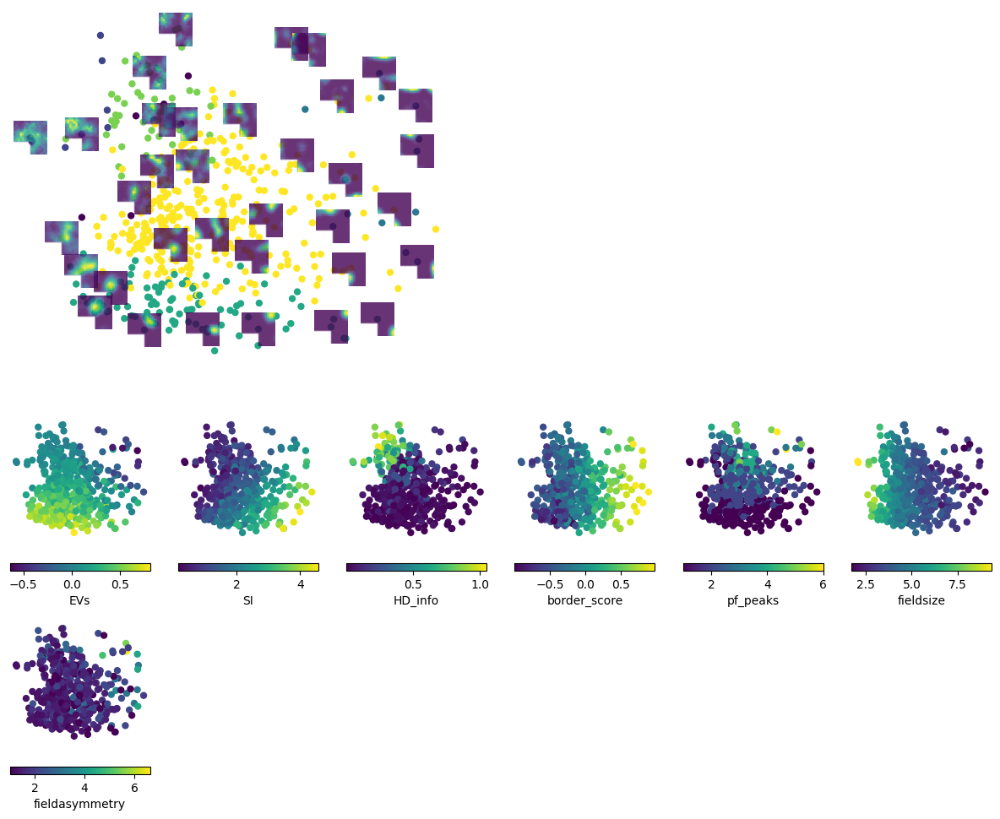

In [49]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


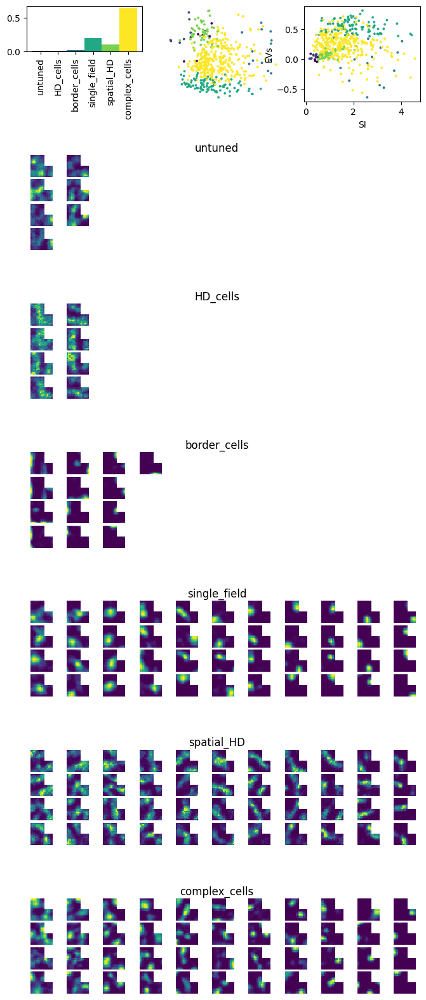

In [50]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_sparse_Grid', savefolder,
                    filetype='pdf')

### Init k=5 Grid

In [3]:
Grid_params = {"n": 800,
               "gridscale_distribution": "modules",
               "gridscale": (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                             0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,),
               "orientation_distribution": "modules",
               "orientation": (0, np.pi/5, 2*np.pi/5, 3*np.pi/5, 4*np.pi/5,
                               5*np.pi/5,6*np.pi/5, 7*np.pi/5, 8*np.pi/5, 9*np.pi/5), #radians 
               "phase_offset_distribution": "uniform",
               "phase_offset": (0, 2 * np.pi), #degrees
               }

In [7]:
env = make_env('RiaB-LRoom', 'ratinabox_grid', 'ContSpeedOnehotHD', seed=42, Grid_params=Grid_params)
agent = RatInABoxAgent('')

prednet = PredictiveNet(env=env,
                        pRNNtype='thRNN_5win',
                        hidden_size=1000,
                        bias_lr=0.2,
                        trainNoiseMeanStd=(0,0.05),
                        f=0.5
                        )

In [8]:
# TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35, border_symmetry_int=0.66, border_symmetry_slope=6)
TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)

/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:378: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:389: RuntimeWarning: invalid value encountered in true_divide
  SI = SI / fr[:, 0, 0]
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:290: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr


Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:174: RuntimeWarning: divide by zero encountered in true_divide
  EVSpace = 1 - np.var(spaceRemoved,axis=0) / (np.var(WAKE_h,axis=0))
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:174: RuntimeWarning: invalid value encountered in true_divide
  EVSpace = 1 - np.var(spaceRemoved,axis=0) / (np.var(WAKE_h,axis=0))
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:412: RuntimeWarning: invalid value encountered in double_scalars
  border_score = (mean_border_rate - mean_nonborder_rate) / (mean_border_rate + mean_nonborder_rate)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:439: RuntimeWarning: invalid value encountered in true_divide
  autocorr = autocorr/np.max(autocorr,axis=None)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  cente

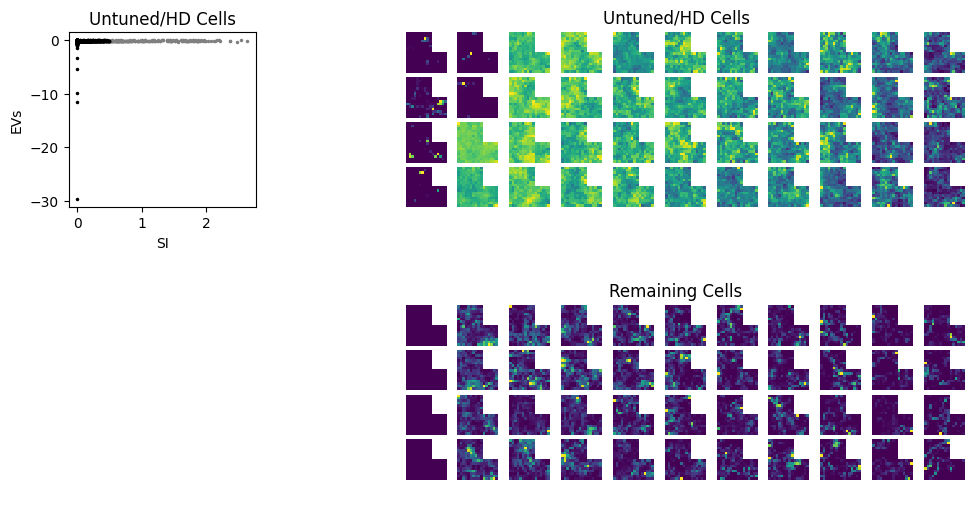

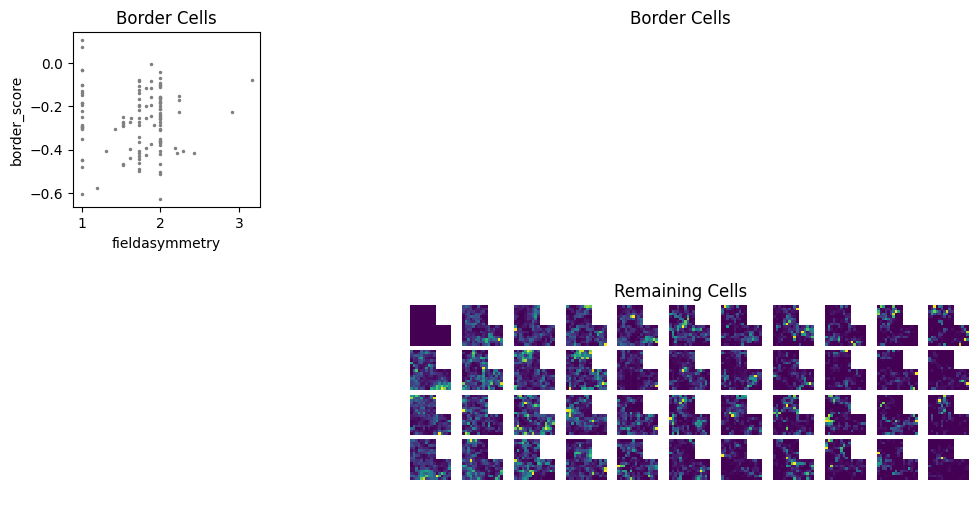

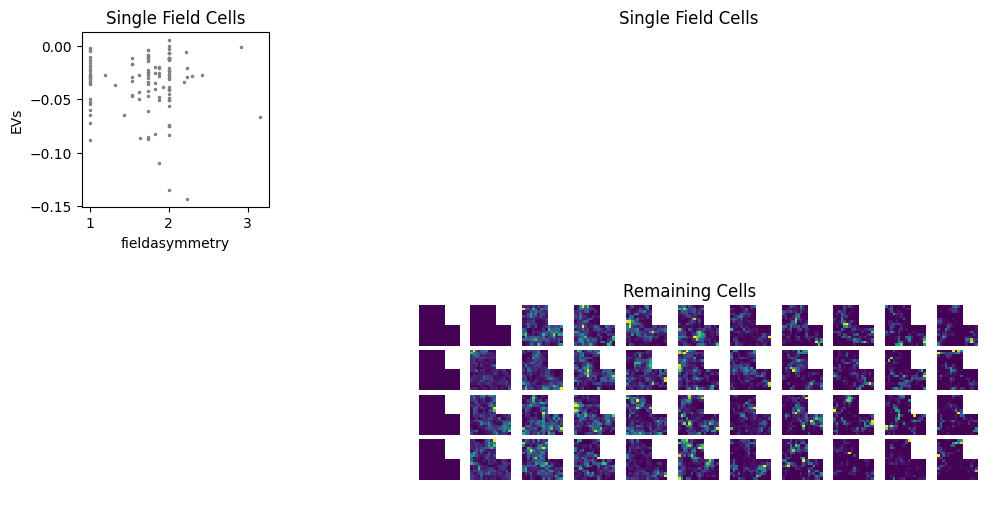

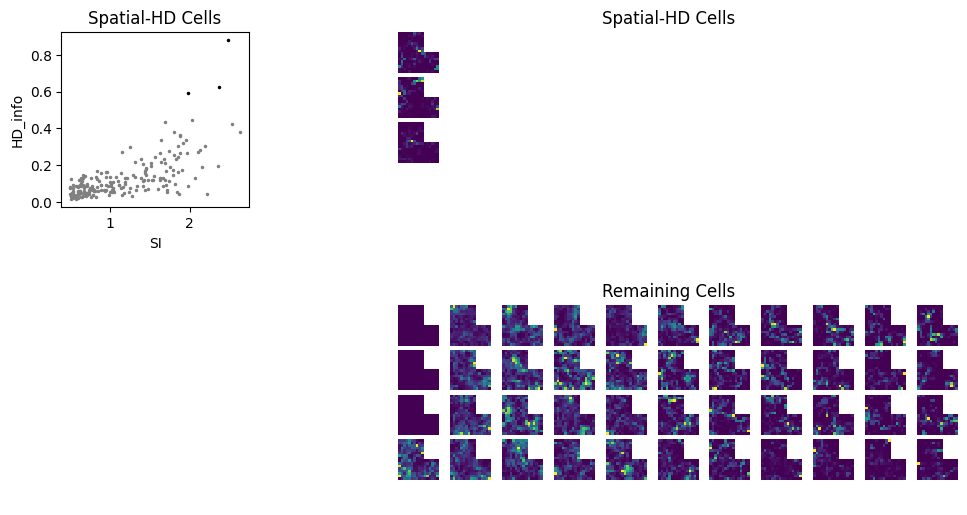

In [9]:
f1, f2, f3, f4 = TCA.cellClassificationFigures()

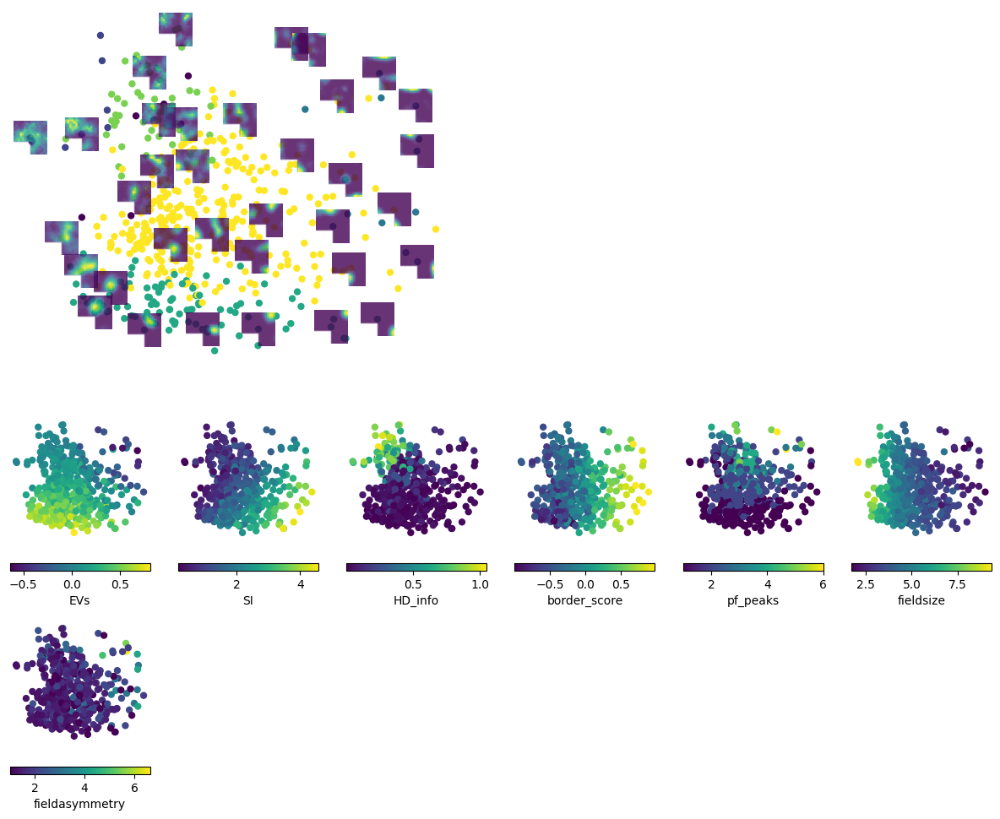

In [ ]:
fig = TCA.cellMapFigure()

/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:327: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


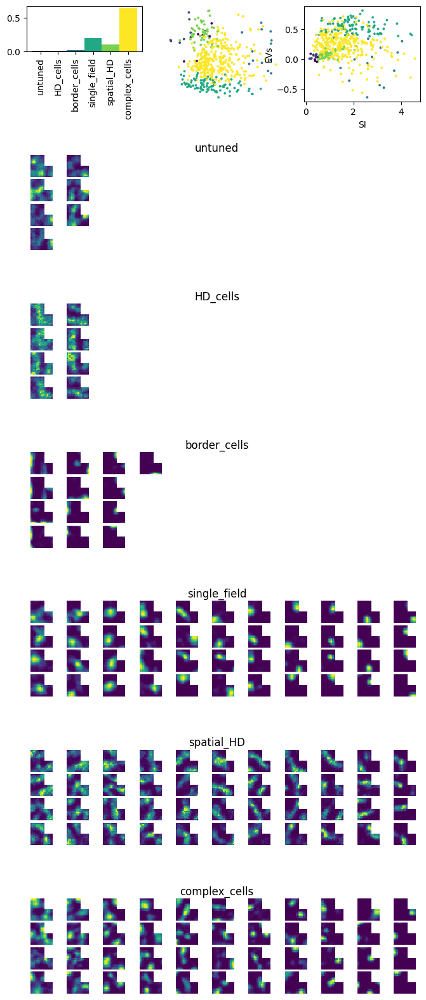

In [ ]:
fig = TCA.cellClassificationFigure()
saveFig(fig, 'TCA_init_k5_Grid', savefolder,
                    filetype='pdf')

### Comparison Sparse (n=10) / k=5 (n=9) Grid

In [3]:
def do_TCA(name):
    prednet = PredictiveNet.loadNet(name)
    TCA = TuningCurveAnalysis(prednet, EV_unthresh=0.1, EV_thresh=0.35)
    return TCA

In [4]:
log_nets = ['example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s8',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s1042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s2042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s3042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s4042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s5042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s6042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s7042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s8042',
            'example_net_RiaB_grid_batch2/lognRNN_mask-ContSpeedOnehotHD-s9042']
k5_nets = ['example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s8',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s2042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s3042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s4042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s5042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s6042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s7042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s8042',
           'example_net_RiaB_grid_batch2/thRNN_5win-ContSpeedOnehotHD-s9042']

In [5]:
log_TCAs = [do_TCA(name) for name in log_nets]
k5_TCAs = [do_TCA(name) for name in k5_nets]

Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname


/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:378: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:389: RuntimeWarning: invalid value encountered in true_divide
  SI = SI / fr[:, 0, 0]
/home/mila/a/aleksei.efremov/venvs/PredictiveReplay_39/lib/python3.9/site-packages/pynapple/process/tuning_curves.py:290: RuntimeWarning: invalid value encountered in true_divide
  fxfr = fx / fr


Calculating EV_s
Running WAKE


/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:174: RuntimeWarning: invalid value encountered in true_divide
  EVSpace = 1 - np.var(spaceRemoved,axis=0) / (np.var(WAKE_h,axis=0))
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:412: RuntimeWarning: invalid value encountered in double_scalars
  border_score = (mean_border_rate - mean_nonborder_rate) / (mean_border_rate + mean_nonborder_rate)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:439: RuntimeWarning: invalid value encountered in true_divide
  autocorr = autocorr/np.max(autocorr,axis=None)
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  centerlabeled = labeled == whicharea
/home/mila/a/aleksei.efremov/pRNN/prnn/analysis/TuningCurveAnalysis.py:465: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  cen

Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE
Net Loaded from pathname
Calculating EV_s
Running WAKE


In [41]:
def calc_hist(groupID):
    hist, _ = np.histogram(groupID, bins = 6)
    return hist/500

In [42]:
log_hists = np.array([calc_hist(TCA.groupID) for TCA in log_TCAs])
k5_hists = np.array([calc_hist(TCA.groupID) for TCA in k5_TCAs])

In [43]:
log_mean, log_std = np.mean(log_hists, axis=0), np.std(log_hists, axis=0)
k5_mean, k5_std = np.mean(k5_hists, axis=0), np.std(k5_hists, axis=0)

In [44]:
cmap = plt.get_cmap('viridis',6)

In [45]:
colors = [cmap(i) for i in range(6)]

In [48]:
groupNames=list(log_TCAs[0].cellgroups.keys())

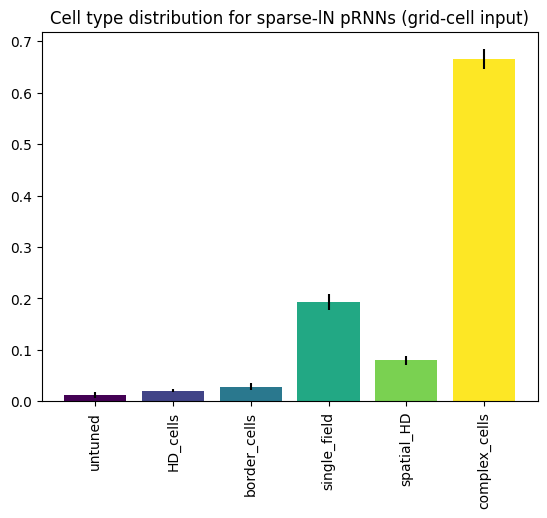

In [55]:
bincenters = np.arange(0.5, 6.5)

plt.bar(bincenters, log_mean, color=colors, yerr=log_std)
plt.xticks(bincenters, groupNames, rotation=90)
plt.title('Cell type distribution for sparse-lN pRNNs (grid-cell input)')
plt.show()

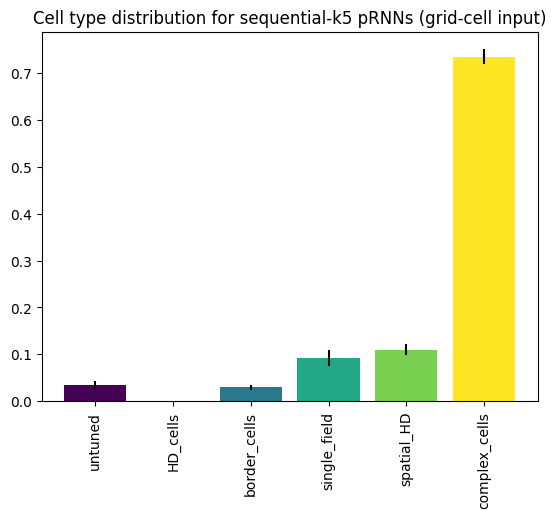

In [56]:
plt.bar(bincenters, k5_mean, color=colors, yerr=k5_std)
plt.xticks(bincenters, groupNames, rotation=90)
plt.title('Cell type distribution for sequential-k5 pRNNs (grid-cell input)')
plt.show()

In [57]:
len(range(10))

10

In [58]:
range(6,10)

range(6, 10)

In [60]:
a = np.array([[1,2,3,4,5,6,7,8,9,10],[1,2,3,4,5,6,7,8,9,10]])
a[:,range(6,9)]

array([[7, 8, 9],
       [7, 8, 9]])